# 00_10 — Regresión PSBP sobre Componentes de la representación funcional

**Objetivo:** Modelar la dinámica temporal de los coeficientes B-spline mediante regresiones
AR(p) con modelo PSBP por componente, **estandarizando previamente las curvas funcionales** y
**verificando la convergencia del MCMC** mediante un conjunto completo de diagnósticos.

## Pipeline completo

```
FAR(1) simulado  ──►  X ∈ ℝ^{T×G}
       ↓
Estandarización por columna (z-score a lo largo de t para cada s_g)
       ↓
B-spline   ──►  Θ ∈ ℝ^{T×K}
       ↓
Para cada componente k y cada cadena c=1..C:
    θ_{t,k} = α_k + Σ_{j=1}^{K} Σ_{l=1}^{p} β_{k,j,l} · γ_{k,j,l} · θ_{t-l,j} + ε_{t,k}    (modelo PSBP_FD_v1)
       ↓
Diagnósticos de convergencia: trazas, ACF, ESS, Geweke, Gelman-Rubin R̂
       ↓
Evaluación: RMSE, P(γ=1), reconstrucción funcional
```

## Rutas del proyecto

| Rol | Ruta |
|-----|------|
| Datos simulados (train + test) | `data/simulaciones/raw/` |
| Predicciones | `data/simulaciones/processed/predict/` |
| Reportes | `reports/simulaciones/` |


# 1. Imports y rutas

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import os
import sys
from pathlib import Path
from datetime import datetime
from scipy import stats
from scipy.signal import correlate
import time
from model_psbp_fd.pipelines import (
    FunctionalDomain,
    FARSimulator,
    gaussian_integral_kernel,
    build_integral_matrix,
)
from model_psbp_fd.functions_models import FunctionalRepresentation
from model_psbp_fd.graphics         import plot_functional_time_series
from model_psbp_fd.models.psbp_fd_v2.psbp_fd_v2 import PSBP_FD_v2

plt.style.use("seaborn-v0_8-darkgrid")
%matplotlib inline

# ── Raíz del proyecto ────────────────────────────────────────────────────────
def get_project_root(marker="README.md"):
    current = Path(os.getcwd()).resolve()
    for parent in [current] + list(current.parents):
        if (parent / marker).exists():
            print(f" PROJECT_ROOT: {parent}")
            return parent
    print(f" No se encontró '{marker}', usando directorio actual")
    return current

PROJECT_ROOT = get_project_root("README.md")
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

# ── Rutas canónicas ───────────────────────────────────────────────────────────
PATHS = {
    "raw":     PROJECT_ROOT / "data" / "simulaciones" / "raw",
    "predict": PROJECT_ROOT / "data" / "simulaciones" / "processed" / "predict",
    "reports": PROJECT_ROOT / "reports" / "simulaciones",
}
for name, path in PATHS.items():
    print(f"  {name:10s} → {path}")


 PROJECT_ROOT: C:\Users\JuanFran\Desktop\git_tesis\model_psbp_fd
  raw        → C:\Users\JuanFran\Desktop\git_tesis\model_psbp_fd\data\simulaciones\raw
  predict    → C:\Users\JuanFran\Desktop\git_tesis\model_psbp_fd\data\simulaciones\processed\predict
  reports    → C:\Users\JuanFran\Desktop\git_tesis\model_psbp_fd\reports\simulaciones


# 2. Simulación y estandarización

## 2.1 Simulación de datos FAR(1)

In [47]:
# ── Identificación ───────────────────────────────────────────────────────────
BASENAME      = "FAR_lineal_st_nuevo_modelo"
TT            = 2
SEED          = 4123
TIMESTAMP     = datetime.now().strftime("%Y%m%d_%H%M%S")
EXPERIMENT_ID = f"convergencia_{BASENAME}_{TT}_{TIMESTAMP}"

print(f"Experiment ID : {EXPERIMENT_ID}")
print(f"Seed (base)   : {SEED}")

# ── Parámetros del proceso FAR(1) ────────────────────────────────────────────
FAR_PARAMS = {
    "n_curves":       100,
    "n_points":       100,
    "bandwidth":      0.05,
    "decay":          0.8,
    "temporal_slope": 4.0,
    "spatial_slope":  2.0,
    "intercept":      1.0,
    "noise_std":      0.2,
    "noise_type":     "smooth",
    "burn_in":        100,
}

print("\n── FAR_PARAMS ──")
for k, v in FAR_PARAMS.items():
    print(f"  {k:<18}: {v}")

Experiment ID : convergencia_FAR_lineal_st_nuevo_modelo_2_20260514_004639
Seed (base)   : 4123

── FAR_PARAMS ──
  n_curves          : 100
  n_points          : 100
  bandwidth         : 0.05
  decay             : 0.8
  temporal_slope    : 4.0
  spatial_slope     : 2.0
  intercept         : 1.0
  noise_std         : 0.2
  noise_type        : smooth
  burn_in           : 100


Datos simulados : (100, 100)  →  T=100 curvas, G=100 puntos


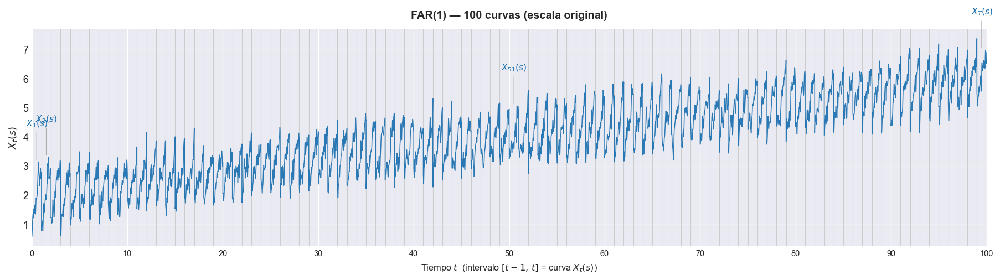

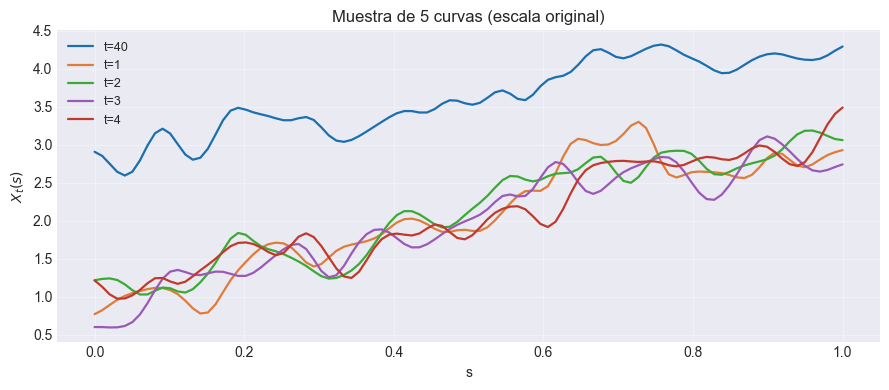

In [48]:
# ── 2.1 Dominio y operador Ψ ──────────────────────────────────────────────────
domain = FunctionalDomain.regular(n_points=FAR_PARAMS["n_points"])
Psi    = build_integral_matrix(
    domain, gaussian_integral_kernel,
    bandwidth = FAR_PARAMS["bandwidth"],
    decay     = FAR_PARAMS["decay"],
)

# ── 2.2 Simulación FAR(1) ─────────────────────────────────────────────────────
sim = FARSimulator(
    domain       = domain,
    n_curves     = FAR_PARAMS["n_curves"],
    Psi          = Psi,
    trend        = "linear",
    trend_params = {
        "temporal_slope": FAR_PARAMS["temporal_slope"],
        "spatial_slope":  FAR_PARAMS["spatial_slope"],
        "intercept":      FAR_PARAMS["intercept"],
    },
    noise_std    = FAR_PARAMS["noise_std"],
    noise_type   = FAR_PARAMS["noise_type"],
    burn_in      = FAR_PARAMS["burn_in"],
    random_state = SEED,
)
X_raw = sim.simulate()   # (T, G)
T, G  = X_raw.shape
print(f"Datos simulados : {X_raw.shape}  →  T={T} curvas, G={G} puntos")

fig = plot_functional_time_series(
    X_raw, domain.grid,
    highlight_idx = [0, 1, sim.n_curves // 2, sim.n_curves - 1],
    title         = f"FAR(1) — {sim.n_curves} curvas (escala original)",
)
plt.show()


#---- Mutres
sample_idx = [40, 1, 2, 3, 4]
colors     = ["#1a6faf", "#e07b39", "#3aaa35", "#9b59b6", "#c0392b"]

fig, ax = plt.subplots(figsize=(9, 4))

for i, t in enumerate(sample_idx):
    ax.plot(domain.grid, X_raw[t],
            color=colors[i], lw=1.6, label=f"t={t}")

ax.set_xlabel("s")
ax.set_ylabel(r"$X_t(s)$")
ax.set_title("Muestra de 5 curvas (escala original)")
ax.legend(fontsize=9)
ax.grid(True, alpha=0.35)
plt.tight_layout()
plt.show()

## 2.2 Estandarización por columna
Aplicamos z-score columna a columna. Guardamos $(\bar{X}_{\cdot,g}, \sigma_{X_{\cdot,g}})$
por si se necesita invertir la transformación posteriormente.

In [49]:
STANDARIZE_CONFIG = {
    "method":     "zscore_column",   # z-score a lo largo de t por cada s_g
    "ddof":       0,                  # consistente con sampler.PSBP_FD_v1
    "store_stats": True,              # guarda mu, sigma para inversión si se necesitase
}

print("── STANDARIZE_CONFIG ──")
for k, v in STANDARIZE_CONFIG.items():
    print(f"  {k:<14}: {v}")


── STANDARIZE_CONFIG ──
  method        : zscore_column
  ddof          : 0
  store_stats   : True


X estandarizada : shape=(100, 100)
  media por columna (debe ≈ 0): max|·| = 2.64e-15
  std   por columna (debe ≈ 1): max|·-1| = 4.44e-16


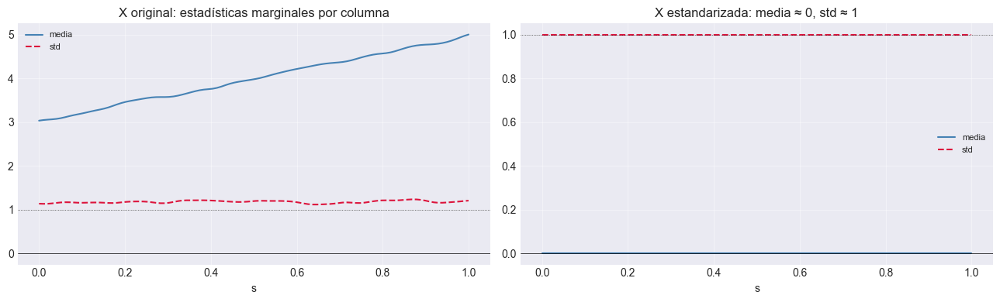

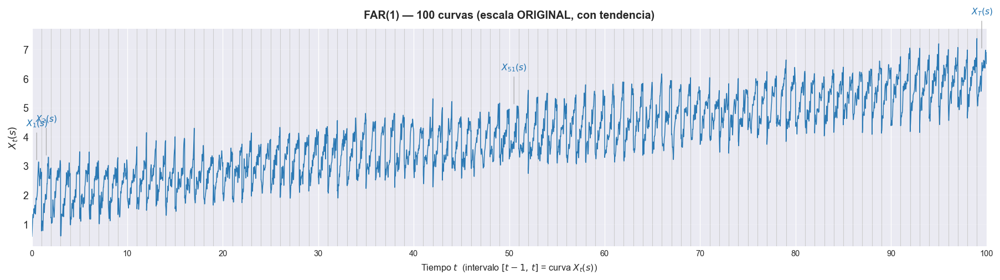

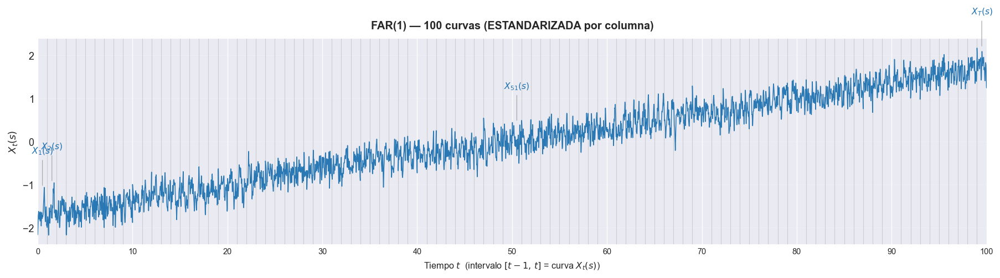

In [50]:
# ── 2.1 z-score por columna ──────────────────────────────────────────────────
X_mean = X_raw.mean(axis=0)                              # (G,)
X_std  = X_raw.std(axis=0, ddof=STANDARIZE_CONFIG["ddof"])  # (G,)

# Salvaguarda: columnas con varianza nula no pueden estandarizarse
if np.any(X_std == 0):
    zero_cols = np.where(X_std == 0)[0]
    raise ValueError(f"Columnas con varianza nula: {zero_cols.tolist()}")

X = (X_raw - X_mean) / X_std        # (T, G) — escala estandarizada
print(f"X estandarizada : shape={X.shape}")
print(f"  media por columna (debe ≈ 0): max|·| = {np.abs(X.mean(axis=0)).max():.2e}")
print(f"  std   por columna (debe ≈ 1): max|·-1| = {np.abs(X.std(axis=0)-1).max():.2e}")

# ── 2.2 Diagnóstico de la estandarización por columna ────────────────────────
# Verifica visualmente que las estadísticas marginales por punto de grilla s
# fueron correctamente neutralizadas (media → 0, std → 1).
fig, axes = plt.subplots(1, 2, figsize=(13, 4))

axes[0].plot(domain.grid, X_raw.mean(axis=0), color="steelblue", lw=1.5, label="media")
axes[0].plot(domain.grid, X_raw.std(axis=0),  color="crimson",   lw=1.5, ls="--", label="std")
axes[0].axhline(0, color="k", lw=0.5)
axes[0].axhline(1, color="k", lw=0.5, ls=":")
axes[0].set_title("X original: estadísticas marginales por columna")
axes[0].set_xlabel("s")
axes[0].legend(fontsize=8)
axes[0].grid(True, alpha=0.4)

axes[1].plot(domain.grid, X.mean(axis=0), color="steelblue", lw=1.5, label="media")
axes[1].plot(domain.grid, X.std(axis=0),  color="crimson",   lw=1.5, ls="--", label="std")
axes[1].axhline(0, color="k", lw=0.5)
axes[1].axhline(1, color="k", lw=0.5, ls=":")
axes[1].set_title("X estandarizada: media ≈ 0, std ≈ 1")
axes[1].set_xlabel("s")
axes[1].legend(fontsize=8)
axes[1].grid(True, alpha=0.4)

plt.tight_layout()
plt.show()

# ── 2.3 Series funcionales completas: original vs estandarizada ──────────────
# Mismo formato que la sección 2 (curvas concatenadas en el eje temporal),
# para apreciar la remoción de la tendencia temporal.
highlight_idx = [0, 1, sim.n_curves // 2, sim.n_curves - 1]

fig_raw = plot_functional_time_series(
    X_raw, domain.grid,
    highlight_idx = highlight_idx,
    title         = f"FAR(1) — {sim.n_curves} curvas (escala ORIGINAL, con tendencia)",
)
plt.show()

fig_std = plot_functional_time_series(
    X, domain.grid,
    highlight_idx = highlight_idx,
    title         = f"FAR(1) — {sim.n_curves} curvas (ESTANDARIZADA por columna)",
)
plt.show()

# 3. Representación funcional: B-spline

## 3.1 Analizar coeficientes 

── Tabla de selección n_basis × order ──


,n_basis,order,var_retained,rmse_mean,rmse_max
0,2,2,96.5558%,0.183524,0.245860
1,3,2,96.9487%,0.172352,0.241151
2,4,2,97.5181%,0.155971,0.225408
3,5,2,97.6544%,0.151524,0.206602
4,6,2,98.0226%,0.139246,0.190020
5,7,2,98.2891%,0.129188,0.185074
6,8,2,98.4959%,0.120962,0.171203
7,9,2,98.5879%,0.116994,0.160505
8,10,2,98.7487%,0.110270,0.151500
9,11,2,98.9320%,0.101218,0.165913



── Recomendación automática ──
  n_basis óptimo  : 19
  order óptimo    : 3
  var_retained    : 99.6489%
  rmse_mean       : 0.057099


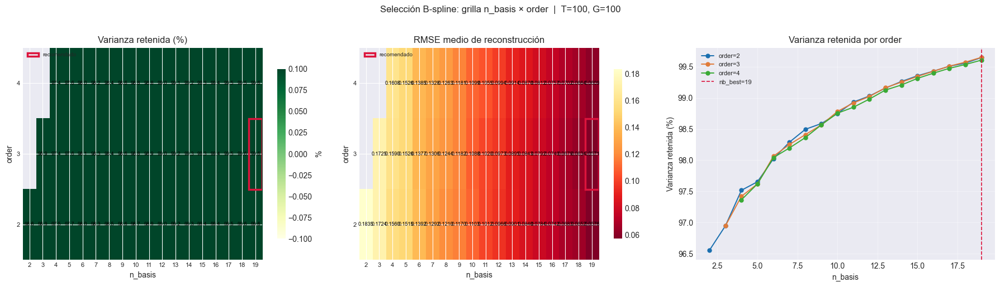

In [51]:
# ── 4.1 Pipeline de selección de n_basis × order (grilla 2D) ─────────────────
# Evalúa todas las combinaciones (n_basis, order) válidas (n_basis >= order)
# y calcula métricas de reconstrucción para encontrar el par óptimo.
#
#   Métricas por combinación:
#     · var_retained : varianza retenida global  (↑ mejor)
#     · rmse_mean    : RMSE medio por curva      (↓ mejor)
#     · rmse_max     : RMSE peor curva           (↓ mejor)
# ─────────────────────────────────────────────────────────────────────────────

N_BASIS_RANGE = range(2, min(20, T // 2))   # eje n_basis
ORDER_RANGE   = range(2, 5)                 # eje order (cuadrático → séxico)

selection_records = []

for order in ORDER_RANGE:
    for nb in N_BASIS_RANGE:
        if nb < order:          # restricción B-spline: n_basis >= order
            continue
        try:
            fr_tmp = FunctionalRepresentation(
                method  = "bspline",
                n_basis = nb,
                order   = order,
            )
            TH_tmp = fr_tmp.fit_transform(X, domain.grid)
            X_rec  = fr_tmp.reconstruct(TH_tmp)

            ss_res = np.sum((X - X_rec) ** 2)
            ss_tot = np.sum((X - X.mean(axis=0, keepdims=True)) ** 2)
            vr     = 1.0 - ss_res / ss_tot
            rmse_c = np.sqrt(np.mean((X - X_rec) ** 2, axis=1))

            selection_records.append({
                "n_basis":      nb,
                "order":        order,
                "var_retained": vr,
                "rmse_mean":    rmse_c.mean(),
                "rmse_max":     rmse_c.max(),
            })
        except Exception as e:
            print(f"  [SKIP] n_basis={nb}, order={order}: {e}")

sel_df = pd.DataFrame(selection_records)

# ── Tabla resumen ─────────────────────────────────────────────────────────────
print("── Tabla de selección n_basis × order ──")
display(sel_df.style.format({
    "var_retained": "{:.4%}",
    "rmse_mean":    "{:.6f}",
    "rmse_max":     "{:.6f}",
}).background_gradient(subset=["var_retained"], cmap="YlGn")
  .background_gradient(subset=["rmse_mean"],    cmap="YlOrRd_r"))

# ── Recomendación automática: máx var_retained, menor n_basis en empate ──────
best_idx  = sel_df.sort_values(
    ["var_retained", "n_basis"], ascending=[False, True]
).index[0]
best_row  = sel_df.loc[best_idx]
nb_best   = int(best_row["n_basis"])
ord_best  = int(best_row["order"])

print(f"\n── Recomendación automática ──")
print(f"  n_basis óptimo  : {nb_best}")
print(f"  order óptimo    : {ord_best}")
print(f"  var_retained    : {best_row['var_retained']:.4%}")
print(f"  rmse_mean       : {best_row['rmse_mean']:.6f}")

# ── Visualización ─────────────────────────────────────────────────────────────
orders_list  = sorted(sel_df["order"].unique())
n_basis_list = sorted(sel_df["n_basis"].unique())

# Pivotar para heatmaps
vr_pivot   = sel_df.pivot(index="order", columns="n_basis", values="var_retained")
rmse_pivot = sel_df.pivot(index="order", columns="n_basis", values="rmse_mean")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Índices del par recomendado
best_nb_idx  = list(vr_pivot.columns).index(nb_best)
best_ord_idx = list(vr_pivot.index).index(ord_best)

# (a) Heatmap var_retained
im0 = axes[0].imshow(
    vr_pivot.values * 100, aspect="auto", cmap="YlGn",
    vmin=vr_pivot.values.min() * 100, vmax=100,
    origin="lower",
)
axes[0].set_xticks(range(len(vr_pivot.columns)))
axes[0].set_xticklabels(vr_pivot.columns, fontsize=8)
axes[0].set_yticks(range(len(vr_pivot.index)))
axes[0].set_yticklabels(vr_pivot.index, fontsize=8)
axes[0].set_xlabel("n_basis")
axes[0].set_ylabel("order")
axes[0].set_title("Varianza retenida (%)")
for i in range(vr_pivot.shape[0]):
    for j in range(vr_pivot.shape[1]):
        val = vr_pivot.values[i, j]
        if not np.isnan(val):
            axes[0].text(j, i, f"{val*100:.1f}",
                         ha="center", va="center", fontsize=6.5,
                         color="black" if val > 0.5 else "gray")
axes[0].add_patch(plt.Rectangle(
    (best_nb_idx - 0.5, best_ord_idx - 0.5), 1, 1,
    fill=False, edgecolor="crimson", lw=2.5, label="recomendado"
))
axes[0].legend(fontsize=7, loc="upper left")
plt.colorbar(im0, ax=axes[0], shrink=0.8, label="%")

# (b) Heatmap RMSE medio
im1 = axes[1].imshow(
    rmse_pivot.values, aspect="auto", cmap="YlOrRd_r",
    origin="lower",
)
axes[1].set_xticks(range(len(rmse_pivot.columns)))
axes[1].set_xticklabels(rmse_pivot.columns, fontsize=8)
axes[1].set_yticks(range(len(rmse_pivot.index)))
axes[1].set_yticklabels(rmse_pivot.index, fontsize=8)
axes[1].set_xlabel("n_basis")
axes[1].set_ylabel("order")
axes[1].set_title("RMSE medio de reconstrucción")
for i in range(rmse_pivot.shape[0]):
    for j in range(rmse_pivot.shape[1]):
        val = rmse_pivot.values[i, j]
        if not np.isnan(val):
            axes[1].text(j, i, f"{val:.4f}",
                         ha="center", va="center", fontsize=6.5, color="black")
axes[1].add_patch(plt.Rectangle(
    (best_nb_idx - 0.5, best_ord_idx - 0.5), 1, 1,
    fill=False, edgecolor="crimson", lw=2.5, label="recomendado"
))
axes[1].legend(fontsize=7, loc="upper left")
plt.colorbar(im1, ax=axes[1], shrink=0.8)

# (c) Curvas var_retained vs n_basis, una línea por order
colors_ord = ["#1a6faf", "#e07b39", "#3aaa35", "#9b59b6", "#c0392b"]
for i, ord_ in enumerate(orders_list):
    sub = sel_df[sel_df["order"] == ord_].sort_values("n_basis")
    axes[2].plot(sub["n_basis"], sub["var_retained"] * 100,
                 marker="o", lw=1.4, ms=5,
                 color=colors_ord[i % len(colors_ord)],
                 label=f"order={ord_}")
axes[2].axvline(nb_best, color="crimson", ls="--", lw=1.2, label=f"nb_best={nb_best}")
axes[2].set_xlabel("n_basis")
axes[2].set_ylabel("Varianza retenida (%)")
axes[2].set_title("Varianza retenida por order")
axes[2].legend(fontsize=8)
axes[2].grid(True, alpha=0.4)

plt.suptitle(
    f"Selección B-spline: grilla n_basis × order  |  T={T}, G={G}",
    fontsize=12, y=1.02,
)
plt.tight_layout()
plt.show()

## 3.2 Ajuste de coeficientes

In [52]:
#Paremtros 

REPRE_PARAMS = {
    "n_basis":      10,    # K intermedio: funciones B-spline
    "order":        2,    # orden del spline (5 = quíntico)
}


print("── REPRE_PARAMS ──")
for k, v in REPRE_PARAMS.items():
    print(f"  {k:<14}: {v}")

── REPRE_PARAMS ──
  n_basis       : 10
  order         : 2


Scores THETA : (100, 10)
  Basis 1: mean= -0.0000  std= 1.0053  range=[ -2.278,   1.983]
  Basis 2: mean=  0.0000  std= 1.0020  range=[ -1.983,   1.767]
  Basis 3: mean=  0.0000  std= 1.0002  range=[ -1.930,   1.800]
  Basis 4: mean= -0.0000  std= 1.0000  range=[ -1.955,   1.940]
  Basis 5: mean=  0.0000  std= 1.0001  range=[ -1.787,   1.888]
  Basis 6: mean=  0.0000  std= 1.0035  range=[ -1.810,   1.964]
  Basis 7: mean=  0.0000  std= 1.0008  range=[ -1.658,   1.889]
  Basis 8: mean=  0.0000  std= 0.9953  range=[ -1.717,   1.732]
  Basis 9: mean= -0.0000  std= 1.0017  range=[ -1.768,   1.743]
  Basis 10: mean=  0.0000  std= 1.0038  range=[ -2.002,   1.774]

Varianza retenida por la base B-spline (10 funciones):
  98.7487%
  RMSE medio por curva  : 0.110270
  RMSE máx              : 0.151500
  RMSE mín              : 0.059128
  Varianza retenida     : 98.75%


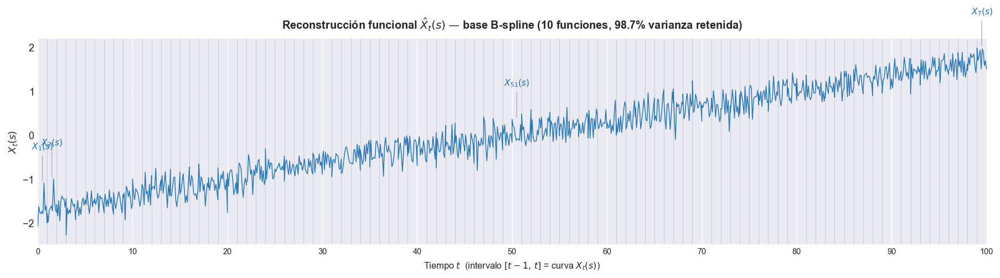

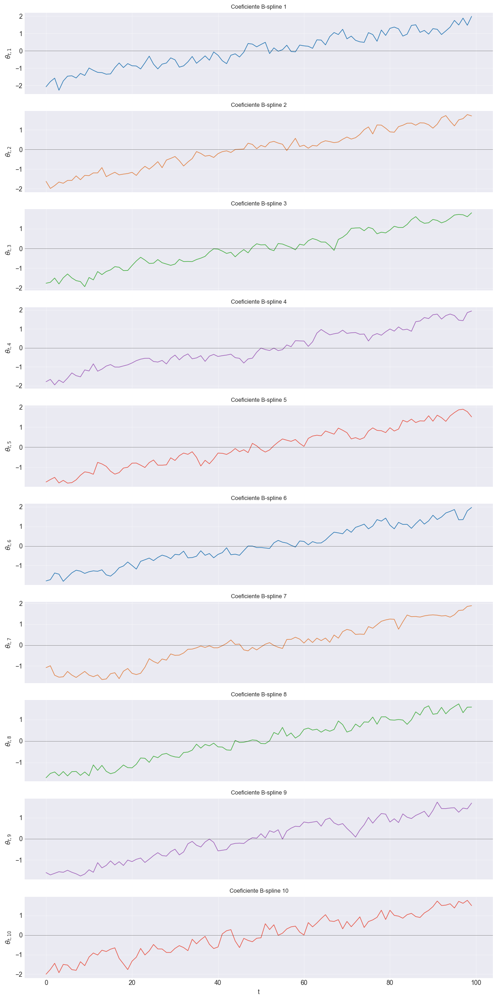

In [53]:
# ── 4.1 Fit + transform ─────────────────────────────────────────────────────
fr    = FunctionalRepresentation(
    method       = "bspline",
    n_basis      = REPRE_PARAMS["n_basis"],
    order        = REPRE_PARAMS["order"],
)
THETA = fr.fit_transform(X, domain.grid)   # (T, n_basis)
n_components = THETA.shape[1]

print(f"Scores THETA : {THETA.shape}")
for k in range(n_components):
    print(f"  Basis {k+1}: mean={THETA[:,k].mean():>8.4f}  std={THETA[:,k].std():>7.4f}  "
          f"range=[{THETA[:,k].min():>7.3f}, {THETA[:,k].max():>7.3f}]")

# ── 4.2 Varianza retenida (bspline: via reconstrucción) ─────────────────────
# Con bspline no hay ranking de componentes por varianza explicada;
# se reporta la varianza global retenida por la base completa.
X_repr     = fr.reconstruct(THETA)                          # (T, G)
ss_res     = np.sum((X - X_repr) ** 2)
ss_tot     = np.sum((X - X.mean(axis=0, keepdims=True)) ** 2)
var_retained = 1.0 - ss_res / ss_tot

print(f"\nVarianza retenida por la base B-spline ({n_components} funciones):")
print(f"  {var_retained * 100:.4f}%")

# ── 4.3 Reconstrucción funcional ─────────────────────────────────────────────
rmse_repr = np.sqrt(np.mean((X - X_repr) ** 2, axis=1))

print(f"  RMSE medio por curva  : {rmse_repr.mean():.6f}")
print(f"  RMSE máx              : {rmse_repr.max():.6f}")
print(f"  RMSE mín              : {rmse_repr.min():.6f}")
print(f"  Varianza retenida     : {var_retained * 100:.2f}%")

highlight_idx = [0, 1, sim.n_curves // 2, sim.n_curves - 1]

fig_repr = plot_functional_time_series(
    X_repr, domain.grid,
    highlight_idx = highlight_idx,
    title         = (
        f"Reconstrucción funcional $\\hat{{X}}_t(s)$ "
        f"— base B-spline ({n_components} funciones, "
        f"{var_retained * 100:.1f}% varianza retenida)"
    ),
)
plt.show()

# ── 4.4 Coeficientes B-spline como series de tiempo ──────────────────────────
colors = ["#1a6faf", "#e07b39", "#3aaa35", "#9b59b6", "#e74c3c"]
fig, axes = plt.subplots(n_components, 1, figsize=(11, 2.2 * n_components), sharex=True)
axes = np.atleast_1d(axes)
for k, ax in enumerate(axes):
    ax.plot(np.arange(T), THETA[:, k], lw=0.9, color=colors[k % len(colors)])
    ax.axhline(0, color="k", lw=0.5, alpha=0.5)
    ax.set_ylabel(rf"$\theta_{{t,{k+1}}}$")
    ax.set_title(f"Coeficiente B-spline {k+1}", fontsize=9)
    ax.grid(True, alpha=0.4)
axes[-1].set_xlabel("t")
plt.tight_layout()
plt.show()

# 4. Construcción de DataFrames 

Para cada componente $k$:
- columna 0 → respuesta: $\theta_{t,k}$ (filas $t = 2, \dots, T$)
- columna 1 → covariable: $\theta_{t-1,k}$ (rezago)

Se pierde una observación por el lag → $T-1$ filas.

## 4.1 Analisis de representacion

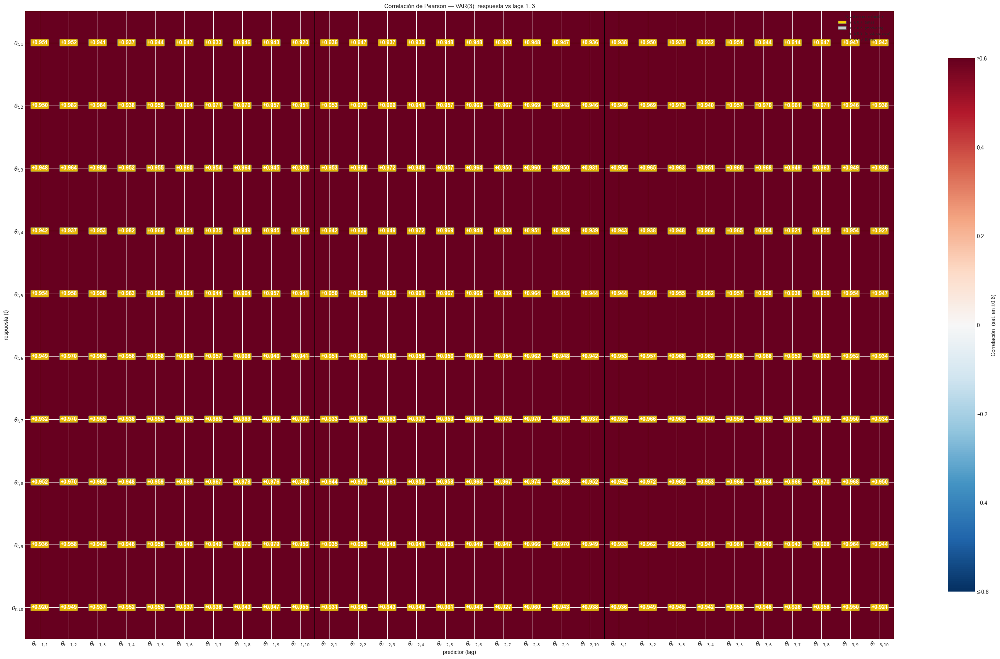

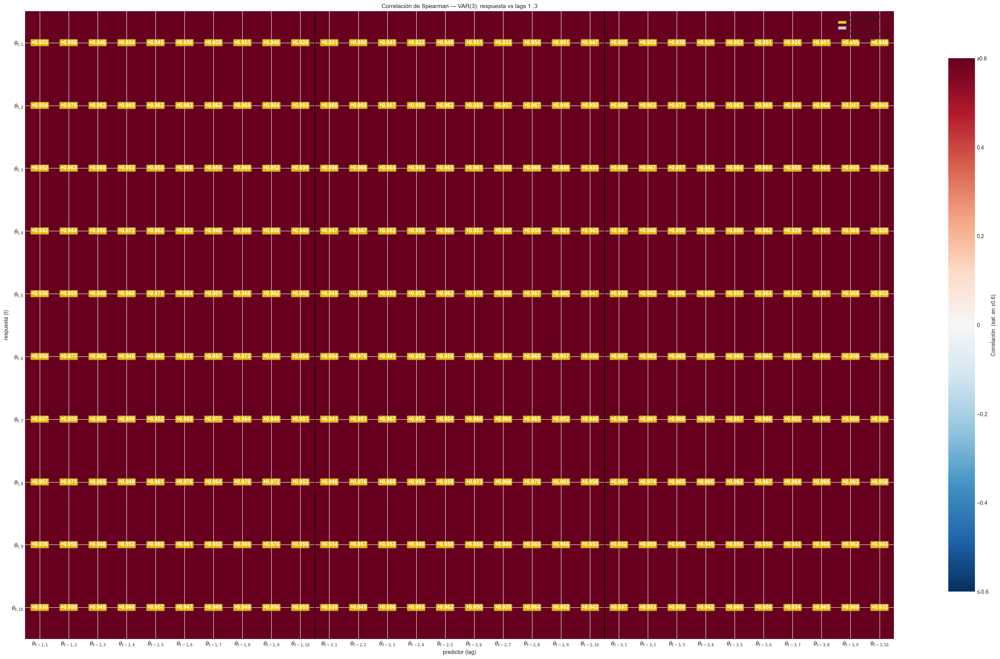


DataFrame del modelo para FPC 1  (shape=(97, 31)):


,theta_1,theta_1_lag1,theta_2_lag1,theta_3_lag1,theta_4_lag1,theta_5_lag1,theta_6_lag1,theta_7_lag1,theta_8_lag1,theta_9_lag1,...,theta_1_lag3,theta_2_lag3,theta_3_lag3,theta_4_lag3,theta_5_lag3,theta_6_lag3,theta_7_lag3,theta_8_lag3,theta_9_lag3,theta_10_lag3
0,-2.278356,-1.580856,-1.839167,-1.495155,-1.955063,-1.501066,-1.384157,-1.450980,-1.446313,-1.641153,...,-2.078461,-1.623258,-1.756708,-1.787448,-1.732127,-1.788523,-1.085863,-1.717287,-1.606889,-2.001815
1,-1.745938,-2.278356,-1.657998,-1.792897,-1.702434,-1.778472,-1.443421,-1.544064,-1.624124,-1.566301,...,-1.781493,-1.983149,-1.709270,-1.665473,-1.609641,-1.725584,-0.996653,-1.514940,-1.715942,-1.757556
2,-1.467049,-1.745938,-1.719786,-1.484384,-1.834770,-1.649788,-1.809614,-1.525369,-1.426766,-1.593044,...,-1.580856,-1.839167,-1.495155,-1.955063,-1.501066,-1.384157,-1.450980,-1.446313,-1.641153,-1.444667
3,-1.446029,-1.467049,-1.576844,-1.289546,-1.599573,-1.786519,-1.590516,-1.269726,-1.630553,-1.496571,...,-2.278356,-1.657998,-1.792897,-1.702434,-1.778472,-1.443421,-1.544064,-1.624124,-1.566301,-1.924581
4,-1.571509,-1.446029,-1.575218,-1.489337,-1.324203,-1.762383,-1.374959,-1.443848,-1.430194,-1.591359,...,-1.745938,-1.719786,-1.484384,-1.834770,-1.649788,-1.809614,-1.525369,-1.426766,-1.593044,-1.502827


In [54]:
# ── 5. Construcción de DataFrames VAR(p) ecuación por ecuación ───────────────
from scipy.stats import spearmanr
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

N_LAGS = 3

dfs = {}
for k in range(n_components):
    cols = {f"theta_{k+1}": THETA[N_LAGS:, k]}
    for lag in range(1, N_LAGS + 1):
        for j in range(n_components):
            cols[f"theta_{j+1}_lag{lag}"] = THETA[N_LAGS - lag : THETA.shape[0] - lag, j]
    dfs[k] = pd.DataFrame(cols)

# ── Diagnóstico: matrices de correlación Pearson y Spearman ──────────────────
n_cov         = n_components * N_LAGS
corr_pearson  = np.zeros((n_components, n_cov))
corr_spearman = np.zeros((n_components, n_cov))

y_block    = THETA[N_LAGS:, :]
col_labels = []

for lag in range(1, N_LAGS + 1):
    x_block = THETA[N_LAGS - lag : THETA.shape[0] - lag, :]
    for j in range(n_components):
        col_idx = (lag - 1) * n_components + j
        for k in range(n_components):
            corr_pearson[k, col_idx]  = np.corrcoef(y_block[:, k], x_block[:, j])[0, 1]
            corr_spearman[k, col_idx] = spearmanr(y_block[:, k], x_block[:, j]).statistic
        col_labels.append(rf"$\theta_{{t-{lag},{j+1}}}$")

row_labels = [rf"$\theta_{{t,{k+1}}}$" for k in range(n_components)]

# ── Umbrales de destacado ─────────────────────────────────────────────────────
# |r| >= 0.7 → negrita grande + recuadro dorado   (correlación alta)
# |r| >= 0.5 → negrita + recuadro gris            (correlación moderada-alta)
# |r| >= 0.3 → cursiva                            (correlación moderada)
# |r|  < 0.3 → normal                             (baja / ruido)

def _text_style(val):
    """Devuelve (fontsize, fontweight, fontstyle, box_color) según |val|."""
    a = abs(val)
    if a >= 0.7:
        return 10, "bold", "normal", "gold"
    elif a >= 0.5:
        return 9,  "bold", "normal", "#cccccc"
    elif a >= 0.3:
        return 9,  "normal", "italic", None
    else:
        return 8,  "normal", "normal", None

VCLIP = 0.6
norm  = mcolors.Normalize(vmin=-VCLIP, vmax=VCLIP, clip=True)
cmap  = "RdBu_r"

def _draw_heatmap(matrix, title):
    fig, ax = plt.subplots(figsize=(0.9 * n_cov + 2, 1.6 * n_components + 1.2))
    im = ax.imshow(matrix, cmap=cmap, norm=norm, aspect="auto")

    ax.set_xticks(range(n_cov))
    ax.set_xticklabels(col_labels, fontsize=10, rotation=0)
    ax.set_yticks(range(n_components))
    ax.set_yticklabels(row_labels, fontsize=10)
    ax.set_xlabel("predictor (lag)")
    ax.set_ylabel("respuesta (t)")
    ax.set_title(title, fontsize=11)

    for lag in range(1, N_LAGS):
        ax.axvline(lag * n_components - 0.5, color="black", lw=1.2)

    for i in range(n_components):
        for j in range(n_cov):
            val = matrix[i, j]
            fs, fw, fstyle, box_col = _text_style(val)
            txt_color = "white" if abs(val) > 0.35 else "black"

            bbox_props = (
                dict(boxstyle="round,pad=0.15", facecolor=box_col,
                     edgecolor="dimgray", alpha=0.85, lw=0.8)
                if box_col else None
            )

            ax.text(j, i, f"{val:+.3f}",
                    ha="center", va="center",
                    color=txt_color,
                    fontsize=fs,
                    fontweight=fw,
                    fontstyle=fstyle,
                    bbox=bbox_props)

    # ── Leyenda de umbrales ───────────────────────────────────────────────────
    legend_elements = [
        mpatches.Patch(facecolor="gold",    edgecolor="dimgray", label="|r| ≥ 0.7  (alta)"),
        mpatches.Patch(facecolor="#cccccc", edgecolor="dimgray", label="|r| ≥ 0.5  (mod-alta)"),
        mpatches.Patch(facecolor="none",    edgecolor="none",    label="|r| ≥ 0.3  (mod, cursiva)"),
        mpatches.Patch(facecolor="none",    edgecolor="none",    label="|r| < 0.3  (baja)"),
    ]
    ax.legend(handles=legend_elements, loc="upper right",
              fontsize=7.5, framealpha=0.9, title="Nivel de correlación", title_fontsize=8)

    cbar = fig.colorbar(im, ax=ax, shrink=0.85, label=f"Correlación  (sat. en ±{VCLIP})")
    cbar.set_ticks([-VCLIP, -0.4, -0.2, 0, 0.2, 0.4, VCLIP])
    cbar.set_ticklabels([f"≤{-VCLIP}", "−0.4", "−0.2", "0", "0.2", "0.4", f"≥{VCLIP}"])

    plt.tight_layout()
    plt.show()

# ── Plot 1: Pearson ───────────────────────────────────────────────────────────
_draw_heatmap(
    corr_pearson,
    f"Correlación de Pearson — VAR({N_LAGS}): respuesta vs lags 1..{N_LAGS}",
)

# ── Plot 2: Spearman ──────────────────────────────────────────────────────────
_draw_heatmap(
    corr_spearman,
    f"Correlación de Spearman — VAR({N_LAGS}): respuesta vs lags 1..{N_LAGS}",
)

print(f"\nDataFrame del modelo para FPC 1  (shape={dfs[0].shape}):")
display(dfs[0].head())

## 4.2 Data frame final 

In [55]:
#Paremtros 

REPRE_PARAMS = {
    "n_basis":      10,    # K intermedio: funciones B-spline
    "order":        2,    # orden del spline (5 = quíntico)
}


print("── REPRE_PARAMS ──")
for k, v in REPRE_PARAMS.items():
    print(f"  {k:<14}: {v}")

── REPRE_PARAMS ──
  n_basis       : 10
  order         : 2


In [56]:
# ── 4.1 Fit + transform ─────────────────────────────────────────────────────
fr    = FunctionalRepresentation(
    method       = "bspline",
    n_basis      = REPRE_PARAMS["n_basis"],
    order        = REPRE_PARAMS["order"],
)
THETA = fr.fit_transform(X, domain.grid)   # (T, n_basis)
n_components = THETA.shape[1]

print(f"Scores THETA : {THETA.shape}")
for k in range(n_components):
    print(f"  Basis {k+1}: mean={THETA[:,k].mean():>8.4f}  std={THETA[:,k].std():>7.4f}  "
          f"range=[{THETA[:,k].min():>7.3f}, {THETA[:,k].max():>7.3f}]")

Scores THETA : (100, 10)
  Basis 1: mean= -0.0000  std= 1.0053  range=[ -2.278,   1.983]
  Basis 2: mean=  0.0000  std= 1.0020  range=[ -1.983,   1.767]
  Basis 3: mean=  0.0000  std= 1.0002  range=[ -1.930,   1.800]
  Basis 4: mean= -0.0000  std= 1.0000  range=[ -1.955,   1.940]
  Basis 5: mean=  0.0000  std= 1.0001  range=[ -1.787,   1.888]
  Basis 6: mean=  0.0000  std= 1.0035  range=[ -1.810,   1.964]
  Basis 7: mean=  0.0000  std= 1.0008  range=[ -1.658,   1.889]
  Basis 8: mean=  0.0000  std= 0.9953  range=[ -1.717,   1.732]
  Basis 9: mean= -0.0000  std= 1.0017  range=[ -1.768,   1.743]
  Basis 10: mean=  0.0000  std= 1.0038  range=[ -2.002,   1.774]


In [57]:
# ── 5. Construcción de DataFrames VAR(p) ecuación por ecuación ───────────────
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

N_LAGS = 1

dfs = {}
for k in range(n_components):
    cols = {f"theta_{k+1}": THETA[N_LAGS:, k]}
    for lag in range(1, N_LAGS + 1):
        for j in range(n_components):
            cols[f"theta_{j+1}_lag{lag}"] = THETA[N_LAGS - lag : THETA.shape[0] - lag, j]
    dfs[k] = pd.DataFrame(cols)


# 5. Ajuste PSBP-FD: C cadenas × K componentes

Ajustamos `N_CHAINS` cadenas independientes (semillas distintas) por cada uno de los
`componentes` componentes. Estructura final:

```
models_chains[k][c] = PSBP_FD_v1 entrenado (componente k, cadena c)
```

In [58]:
# ════════════════════════════════════════════════════════════════════════════
#          6. Hiperparámetros del experimento  (v2 — priors heterogéneas)
# ════════════════════════════════════════════════════════════════════════════
#
# MODOS DE ESPECIFICACIÓN
# ────────────────────────
#   PRIOR_MODE = 'homogeneous'    → un escalar por parámetro (comportamiento
#                                   original). Todas las variables reciben la
#                                   misma prior en todos los componentes.
#
#   PRIOR_MODE = 'heterogeneous'  → arrays de longitud p por parámetro.
#                                   Se construyen automáticamente a partir de
#                                   PRIOR_TEMPLATES (ver sección 4). Cada
#                                   componente k recibe su propio dict hp_k
#                                   donde la 'variable propia' (lag propio)
#                                   tiene prior diferente a las cruzadas.
#
# RESULTADO
# ─────────
#   HYPERPARAMS_LIST : list[dict] de longitud n_components.
#       HYPERPARAMS_LIST[k]  →  hp para el componente k.
#       En modo homogeneous, todos los dicts son idénticos.
#
#   La celda de ajuste (sección 6.2) usa HYPERPARAMS_LIST[k] en vez del
#   antiguo HYPERPARAMS global.
#
# ════════════════════════════════════════════════════════════════════════════


# ── (1) Configuración MCMC ──────────────────────────────────────────────────
#
#   nsim  — Iteraciones Gibbs totales por cadena.
#            Regla: nsim - burn >= 1000 muestras post-burn para diagnósticos.
#
#   burn  — Período de calentamiento. El sampler LO GUARDA; se descarta
#            downstream. Regla práctica: 10-20% de nsim.
#
#   N     — Truncamiento PSBP (número máximo de átomos). Si N1out (átomos
#            activos) ≈ N en muchas iteraciones → subir N.
#
#   M     — Grilla para Gamma_jh. Mayor M = más precisión, más costo.
# ──────────────────────────────────────────────────────────────────────────
MCMC_CONFIG = {
    'nsim': 1500,   # iteraciones totales
    'burn':  500,   # burn-in (≈ 33% de nsim)
    'N':      12,   # truncamiento del PSBP
    'M':      50,   # grilla para Gamma_jh
}


# ── (2) Diseño multi-cadena  (Gelman-Rubin) ─────────────────────────────────
#
#   N_CHAINS   — Cadenas independientes por componente. Mínimo 2 para R̂.
#   CHAIN_SEEDS — Semillas distintas (mismo RNG base + offset por cadena).
# ──────────────────────────────────────────────────────────────────────────
N_CHAINS    = 1
CHAIN_SEEDS = [SEED + 100 * c for c in range(N_CHAINS)]


# ── (3) Priors escalares globales  (siempre homogéneas) ─────────────────────
#
#   Estos parámetros NO soportan heterogeneidad por variable; son globales
#   para el modelo y se pasan igual a todos los componentes.
#
#   atau, btau  → Gamma(atau, btau) sobre precisión tau_h de cada átomo h.
#                 E[tau_h] = atau/btau. Con (0.5, 0.5): E=1, Var=2 (débil).
#
#   ag, bg      → Gamma(ag, bg) sobre el g-prior de Zellner (escala de betas).
#                 Mismo perfil débil.
#
#   mumu, taumu → Normal(mumu, 1/taumu) sobre mu (media global de alpha_h).
#                 N(0, 1): centrada, varianza unitaria.
#
#   pwj         → Bernoulli(pwj) sobre w_j (activación global de variable j).
#                 0.5 → prior no informativa (50/50 a priori).
# ──────────────────────────────────────────────────────────────────────────
HP_GLOBAL = {
    'atau':   0.5,   # Gamma para tau_h : E[tau]=1, Var=2
    'btau':   0.5,
    'ag':     0.5,   # g-prior : mismo perfil débil
    'bg':     0.5,
    'mumu':   0.0,   # Normal sobre mu global del PSBP
    'taumu':  1.0,
    'pwj':    0.5,   # Bernoulli : activación global (non-informative)
}


# ── (4) Modo y priors por variable ──────────────────────────────────────────

PRIOR_MODE = 'heterogeneous'  # 'homogeneous'  |  'heterogeneous'

# ── (4a) Caso homogéneo ──────────────────────────────────────────────────────
# Un escalar por parámetro. Equivalente al comportamiento original.
#
#   apij, bpij   → Beta(apij, bpij) sobre pi_j (prob. de inclusión).
#                  E[pi_j] = apij / (apij + bpij).
#                  (1, 5) → E≈0.17  sparsidad moderada (default PSBP).
#
#   mupsij, taupsij → Normal+(mupsij, 1/taupsij) sobre psi_jh (pendiente
#                     probit). Truncada en 0. (0, 1): débil, centrada.
# ──────────────────────────────────────────────────────────────────────────
HP_HOMO = {
    'apij':    1.0,   # Beta(1, 5) → E[pi_j] ≈ 0.17  (sparsidad moderada)
    'bpij':    5.0,
    'mupsij':  0.0,   # Normal+(0, 1) truncada  (prior débil)
    'taupsij': 1.0,
}

# ── (4b) Caso heterogéneo ────────────────────────────────────────────────────
# Se definen templates de prior por TIPO de covariable. La función
# _build_hp_arrays aplica el template correcto a cada posición del array
# según el nombre de la covariable y el componente k que se está ajustando.
#
# Tipos disponibles (alineados con la estructura theta_{j}_lag{l}):
#
#   'own_lag1'   → lag propio de orden 1 del componente k.
#                  Esperamos que sea relevante → prior PERMISIVA (alta inclusión).
#
#   'cross_lag1' → lag de otro componente en orden 1.
#                  Posiblemente útil, pero dudoso → prior MODERADA.
#
#   'higher_lag' → lags de orden >= 2 (propios o cruzados).
#                  En AR(1)/FAR(1) poco esperados → prior MUY SPARSE.
#
# Formato de cada template: (apij, bpij, mupsij, taupsij)
#   E[pi_j] = apij / (apij + bpij)
# ──────────────────────────────────────────────────────────────────────────
PRIOR_TEMPLATES = {
    #                 apij  bpij  mupsij taupsij       E[pi_j]
    'own_lag1':   (  3.0,  1.0,   0.0,   1.0 ),  # ≈ 0.75  (relevante a priori)
    'cross_lag1': (  1.0,  5.0,   0.0,   1.0 ),  # ≈ 0.17  (sparse moderado)
    'higher_lag': (  1.0, 10.0,   0.0,   0.5 ),  # ≈ 0.09  (muy sparse)
}


# ── Helpers ──────────────────────────────────────────────────────────────────

def _var_type(cov_name, k):
    """Clasifica la covariable por tipo respecto al componente k."""
    # Nombre esperado: 'theta_{j+1}_lag{lag}'
    parts = cov_name.split('_lag')
    lag   = int(parts[1])
    comp  = int(parts[0].replace('theta_', '')) - 1   # 0-indexed
    if lag == 1 and comp == k:
        return 'own_lag1'
    if lag == 1:
        return 'cross_lag1'
    return 'higher_lag'


def _build_hp_arrays(k, cov_names, templates):
    """Construye arrays de priors heterogéneas para el componente k."""
    p = len(cov_names)
    apij    = np.empty(p)
    bpij    = np.empty(p)
    mupsij  = np.empty(p)
    taupsij = np.empty(p)
    for idx, name in enumerate(cov_names):
        vtype = _var_type(name, k)
        apij[idx], bpij[idx], mupsij[idx], taupsij[idx] = templates[vtype]
    return {'apij': apij, 'bpij': bpij, 'mupsij': mupsij, 'taupsij': taupsij}


# ── Construcción de HYPERPARAMS_LIST ────────────────────────────────────────
# Nombres de covariables (igual que en la construcción de dfs)
p         = n_components * N_LAGS
cov_names = [
    f'theta_{j+1}_lag{lag}'
    for lag in range(1, N_LAGS + 1)
    for j   in range(n_components)
]

HYPERPARAMS_LIST = []
for k in range(n_components):
    if PRIOR_MODE == 'homogeneous':
        hp_k = {**HP_GLOBAL, **HP_HOMO}
    else:
        hp_k = {**HP_GLOBAL, **_build_hp_arrays(k, cov_names, PRIOR_TEMPLATES)}
    HYPERPARAMS_LIST.append(hp_k)


# ── Resumen de configuración ─────────────────────────────────────────────────
_W = 68
print('=' * _W)
print(f'  CONFIGURACIÓN PSBP-FD  —  modo prior: {PRIOR_MODE.upper()}')
print('=' * _W)

print(f'\n── (1) MCMC')
for k, v in MCMC_CONFIG.items():
    print(f'    {k:<6}: {v}')

print(f'\n── (2) Multi-cadena')
print(f'    N_CHAINS    : {N_CHAINS}')
print(f'    CHAIN_SEEDS : {CHAIN_SEEDS}')

print(f'\n── (3) Priors globales (escalares)')
for k, v in HP_GLOBAL.items():
    print(f'    {k:<8}: {v}')

if PRIOR_MODE == 'homogeneous':
    e_pi = HP_HOMO['apij'] / (HP_HOMO['apij'] + HP_HOMO['bpij'])
    print(f'\n── (4) Priors por variable (HOMOGÉNEAS — escalares)')
    for k, v in HP_HOMO.items():
        print(f'    {k:<8}: {v}')
    print(f'\n    E[pi_j] = {HP_HOMO["apij"]:.1f}/({HP_HOMO["apij"]:.1f}+{HP_HOMO["bpij"]:.1f}) = {e_pi:.3f}  (todas las variables/componentes)')

else:
    print(f'\n── (4) Priors por variable (HETEROGÉNEAS — arrays)')
    print(f'    Estructura: p = n_components x N_LAGS = {n_components} x {N_LAGS} = {p} covariables')
    print()
    hdr = f"    {'Tipo':<14} {'apij':>6} {'bpij':>6} {'E[pi]':>7} {'mupsij':>8} {'taupsij':>9}"
    print(hdr)
    print('    ' + '-' * (len(hdr) - 4))
    for vtype, (a, b, m, t) in PRIOR_TEMPLATES.items():
        e = a / (a + b)
        print(f"    {vtype:<14} {a:>6.1f} {b:>6.1f} {e:>7.3f} {m:>8.1f} {t:>9.1f}")

    print(f'\n    Ejemplo de asignación — componente k=0:')
    hdr2 = f"    {'#':>3}  {'Covariable':<22} {'Tipo':<14} {'apij':>6} {'bpij':>6} {'E[pi]':>7}"
    print(hdr2)
    print('    ' + '-' * (len(hdr2) - 4))
    hp0 = HYPERPARAMS_LIST[0]
    for idx, name in enumerate(cov_names):
        vtype = _var_type(name, 0)
        a = hp0['apij'][idx];  b = hp0['bpij'][idx]
        e = a / (a + b)
        marker = '  <-- lag propio' if vtype == 'own_lag1' else ''
        print(f"    {idx:>3}  {name:<22} {vtype:<14} {a:>6.1f} {b:>6.1f} {e:>7.3f}{marker}")

print(f'\n' + '=' * _W)
print(f'  HYPERPARAMS_LIST construido: {len(HYPERPARAMS_LIST)} componentes x {p} variables')
print('=' * _W)


  CONFIGURACIÓN PSBP-FD  —  modo prior: HETEROGENEOUS

── (1) MCMC
    nsim  : 1500
    burn  : 500
    N     : 12
    M     : 50

── (2) Multi-cadena
    N_CHAINS    : 1
    CHAIN_SEEDS : [4123]

── (3) Priors globales (escalares)
    atau    : 0.5
    btau    : 0.5
    ag      : 0.5
    bg      : 0.5
    mumu    : 0.0
    taumu   : 1.0
    pwj     : 0.5

── (4) Priors por variable (HETEROGÉNEAS — arrays)
    Estructura: p = n_components x N_LAGS = 10 x 1 = 10 covariables

    Tipo             apij   bpij   E[pi]   mupsij   taupsij
    -------------------------------------------------------
    own_lag1          3.0    1.0   0.750      0.0       1.0
    cross_lag1        1.0    5.0   0.167      0.0       1.0
    higher_lag        1.0   10.0   0.091      0.0       0.5

    Ejemplo de asignación — componente k=0:
      #  Covariable             Tipo             apij   bpij   E[pi]
    ----------------------------------------------------------------
      0  theta_1_lag1           own_la

In [59]:
# ── Especificaciones de prior por componente ────────────────────────────────
_W = 72
for k in range(n_components):
    hp = HYPERPARAMS_LIST[k]
    print("═" * _W)
    print(f"  Componente k={k+1}  —  respuesta: theta_{k+1}")
    print("═" * _W)

    # Escalares globales (iguales para todos)
    print(f"  Priors globales: atau={hp['atau']} btau={hp['btau']}  "
          f"ag={hp['ag']} bg={hp['bg']}  "
          f"mumu={hp['mumu']} taumu={hp['taumu']}  pwj={hp['pwj']}")
    print()

    # Tabla por variable
    apij    = hp['apij']
    bpij    = hp['bpij']
    mupsij  = hp['mupsij']
    taupsij = hp['taupsij']

    scalar = not hasattr(apij, '__len__')
    if scalar:
        e_pi = apij / (apij + bpij)
        print(f"  {'Variable':<22} {'apij':>6} {'bpij':>6} {'E[pi]':>7} {'mupsij':>8} {'taupsij':>9}  Tipo")
        print(f"  {'-'*22} {'-'*6} {'-'*6} {'-'*7} {'-'*8} {'-'*9}  ----")
        for name in cov_names:
            print(f"  {name:<22} {apij:>6.1f} {bpij:>6.1f} {e_pi:>7.3f} {mupsij:>8.1f} {taupsij:>9.1f}  (homogeneous)")
    else:
        print(f"  {'Variable':<22} {'apij':>6} {'bpij':>6} {'E[pi]':>7} {'mupsij':>8} {'taupsij':>9}  Tipo")
        print(f"  {'-'*22} {'-'*6} {'-'*6} {'-'*7} {'-'*8} {'-'*9}  ----")
        for idx, name in enumerate(cov_names):
            a = apij[idx];    b = bpij[idx]
            m = mupsij[idx];  t = taupsij[idx]
            e = a / (a + b)
            vtype = _var_type(name, k)
            marker = "  <-- alta activacion" if vtype == "own_lag1" else ""
            print(f"  {name:<22} {a:>6.1f} {b:>6.1f} {e:>7.3f} {m:>8.1f} {t:>9.1f}  {vtype}{marker}")
    print()

════════════════════════════════════════════════════════════════════════
  Componente k=1  —  respuesta: theta_1
════════════════════════════════════════════════════════════════════════
  Priors globales: atau=0.5 btau=0.5  ag=0.5 bg=0.5  mumu=0.0 taumu=1.0  pwj=0.5

  Variable                 apij   bpij   E[pi]   mupsij   taupsij  Tipo
  ---------------------- ------ ------ ------- -------- ---------  ----
  theta_1_lag1              3.0    1.0   0.750      0.0       1.0  own_lag1  <-- alta activacion
  theta_2_lag1              1.0    5.0   0.167      0.0       1.0  cross_lag1
  theta_3_lag1              1.0    5.0   0.167      0.0       1.0  cross_lag1
  theta_4_lag1              1.0    5.0   0.167      0.0       1.0  cross_lag1
  theta_5_lag1              1.0    5.0   0.167      0.0       1.0  cross_lag1
  theta_6_lag1              1.0    5.0   0.167      0.0       1.0  cross_lag1
  theta_7_lag1              1.0    5.0   0.167      0.0       1.0  cross_lag1
  theta_8_lag1         

In [60]:
models_chains = {k: {} for k in range(n_components)}
fit_times     = {k: {} for k in range(n_components)}

t_global = time.perf_counter()
for k in range(n_components):
    print(f"\n{'='*60}")
    print(f"  FPC {k+1}  —  ajustando {N_CHAINS} cadenas")
    print(f"  DataFrame: shape={dfs[k].shape}, p={dfs[k].shape[1] - 1} covariables")
    print(f"{'='*60}")
    for c, seed_c in enumerate(CHAIN_SEEDS):
        print(f"\n  ── cadena {c+1}/{N_CHAINS}  (seed={seed_c}) ──")
        t0 = time.perf_counter()
        m = PSBP_FD_v2(
            mcmc_cfg      = MCMC_CONFIG,
            hp            = HYPERPARAMS_LIST[k],   # prior específica por componente
            seed          = seed_c,
            verbose_every = 100,
        )
        m.fit(dfs[k])
        elapsed = time.perf_counter() - t0
        models_chains[k][c] = m
        fit_times[k][c]     = elapsed
        print(f"  [OK] FPC {k+1} | cadena {c+1}  "
              f"({elapsed:.1f}s, n_features={m.n_features_})")

t_total = time.perf_counter() - t_global
print(f"\n{'='*60}")
print(f"Todos los modelos ajustados — tiempo total: {t_total:.1f}s "
      f"({t_total/60:.1f} min)")
print(f"Tiempo medio por cadena: {t_total / (n_components * N_CHAINS):.1f}s")
print(f"{'='*60}")


  FPC 1  —  ajustando 1 cadenas
  DataFrame: shape=(99, 11), p=10 covariables

  ── cadena 1/1  (seed=4123) ──
  iter 100/1500
  iter 200/1500
  iter 300/1500
  iter 400/1500
  iter 500/1500
  iter 600/1500
  iter 700/1500
  iter 800/1500
  iter 900/1500
  iter 1000/1500
  iter 1100/1500
  iter 1200/1500
  iter 1300/1500
  iter 1400/1500
  iter 1500/1500
  [OK] FPC 1 | cadena 1  (1703.5s, n_features=10)

  FPC 2  —  ajustando 1 cadenas
  DataFrame: shape=(99, 11), p=10 covariables

  ── cadena 1/1  (seed=4123) ──
  iter 100/1500
  iter 200/1500
  iter 300/1500
  iter 400/1500
  iter 500/1500
  iter 600/1500
  iter 700/1500
  iter 800/1500
  iter 900/1500
  iter 1000/1500
  iter 1100/1500
  iter 1200/1500
  iter 1300/1500
  iter 1400/1500
  iter 1500/1500
  [OK] FPC 2 | cadena 1  (1390.8s, n_features=10)

  FPC 3  —  ajustando 1 cadenas
  DataFrame: shape=(99, 11), p=10 covariables

  ── cadena 1/1  (seed=4123) ──
  iter 100/1500
  iter 200/1500
  iter 300/1500
  iter 400/1500
  iter 5

# 6. Diagnósticos de convergencia

Trabajamos sobre las trazas post burn-in. Para parámetros multidimensionales (átomos,
variables) tomamos la **media sobre la dimensión de átomos** para obtener un escalar por
iteración. Esto reduce dimensión y captura el comportamiento agregado del componente.

## Estadísticos implementados

| Estadístico | Fórmula / referencia | Lectura |
|---|---|---|
| ACF(lag) | $\hat{\rho}_h = \widehat{\text{Cov}}(x_t, x_{t+h}) / \widehat{\text{Var}}(x_t)$ | autocorrelación residual: cerca de 0 ⇒ buen mezcla |
| ESS | $\text{ESS} = N / (1 + 2 \sum_{h=1}^{H} \hat{\rho}_h)$ (Geyer, 1992) | tamaño efectivo: ESS ≳ 400 ideal |
| Geweke z | $z = (\bar{x}_A - \bar{x}_B) / \sqrt{\hat{\sigma}^2_A/n_A + \hat{\sigma}^2_B/n_B}$ | $\|z\| < 2$ ⇒ no rechazo igualdad de medias entre dos sub-cadenas |
| Gelman-Rubin R̂ | $\hat{R} = \sqrt{((n-1)/n + (m+1)/(mn) \cdot B/W)}$ | R̂ < 1.1 ⇒ convergencia entre cadenas (Brooks-Gelman 1998) |

Implementamos cada uno *desde cero* sin dependencias externas (`arviz`) para mantener
auditabilidad del cálculo.

## 6.1 Funciones auxiliares de diagnóstico

In [61]:
def autocorr(x: np.ndarray, max_lag: int = 100) -> np.ndarray:
    """
    Autocorrelación muestral hasta `max_lag` (incluye lag 0 = 1.0).
    Implementación vía FFT (eficiente para cadenas largas).
    """
    x = np.asarray(x, dtype=np.float64).ravel()
    n = len(x)
    x_c = x - x.mean()
    # padding para FFT lineal (evita correlación circular)
    nfft = 1 << (2 * n - 1).bit_length()
    f = np.fft.rfft(x_c, n=nfft)
    acf_full = np.fft.irfft(f * np.conj(f), n=nfft)[:n]
    acf_full /= acf_full[0]
    return acf_full[: max_lag + 1]


def ess_geyer(x: np.ndarray) -> float:
    """
    Effective Sample Size con regla de truncamiento de Geyer:
    suma autocorrelaciones por pares (lag impar+par) mientras la suma sea positiva.
    Referencia: Geyer (1992) "Practical Markov Chain Monte Carlo", Statistical Science.
    """
    x = np.asarray(x, dtype=np.float64).ravel()
    n = len(x)
    rho = autocorr(x, max_lag=min(n - 1, 1000))
    # Truncamiento de Geyer (initial positive sequence)
    s = 0.0
    for k in range(1, len(rho) - 1, 2):
        pair = rho[k] + rho[k + 1]
        if pair < 0:
            break
        s += pair
    tau_int = 1.0 + 2.0 * s
    return float(n / tau_int) if tau_int > 0 else float(n)


def geweke_z(x: np.ndarray, first: float = 0.1, last: float = 0.5) -> float:
    """
    Diagnóstico de Geweke: test z de igualdad de medias entre la primera
    fracción `first` y la última fracción `last` de la cadena.
    Varianzas estimadas con corrección por autocorrelación (vía ESS).
    """
    x = np.asarray(x, dtype=np.float64).ravel()
    n = len(x)
    n_a = int(first * n)
    n_b = int(last  * n)
    if n_a < 2 or n_b < 2:
        return np.nan
    x_a = x[:n_a]
    x_b = x[-n_b:]
    mean_a, mean_b = x_a.mean(), x_b.mean()
    var_a = x_a.var(ddof=1) / max(ess_geyer(x_a), 1.0)
    var_b = x_b.var(ddof=1) / max(ess_geyer(x_b), 1.0)
    denom = np.sqrt(var_a + var_b)
    if denom == 0 or not np.isfinite(denom):
        return np.nan
    return float((mean_a - mean_b) / denom)


def gelman_rubin(chains: np.ndarray) -> float:
    """
    Estadístico R̂ de Gelman-Rubin (Brooks-Gelman 1998).
    `chains` shape: (m, n) con m cadenas de longitud n (ya descontado burn-in).
    """
    chains = np.asarray(chains, dtype=np.float64)
    if chains.ndim != 2:
        raise ValueError("chains debe ser 2D (m_chains, n_iter)")
    m, n = chains.shape
    if m < 2 or n < 2:
        return np.nan
    chain_means = chains.mean(axis=1)                       # (m,)
    chain_vars  = chains.var(axis=1, ddof=1)                # (m,)
    grand_mean  = chain_means.mean()
    B = n * chain_means.var(ddof=1)                         # between
    W = chain_vars.mean()                                   # within
    if W == 0:
        return np.nan
    var_hat = (n - 1) / n * W + (1.0 / n) * B               # estimador combinado
    return float(np.sqrt(var_hat / W))


def aggregate_trace(trace: np.ndarray, burn: int) -> np.ndarray:
    """
    Convierte una traza de shape (nsim,), (nsim, K) o (nsim, K1, K2) en
    un vector 1D de longitud (nsim - burn), promediando sobre las dimensiones
    de átomos/variables.
    """
    trace = np.asarray(trace)
    if trace.ndim == 1:
        agg = trace
    elif trace.ndim == 2:
        agg = trace.mean(axis=1)
    elif trace.ndim == 3:
        agg = trace.mean(axis=(1, 2))
    else:
        raise ValueError(f"ndim no soportado: {trace.ndim}")
    return agg[burn:].astype(np.float64)


print("Funciones de diagnóstico listas: autocorr, ess_geyer, geweke_z, gelman_rubin, aggregate_trace.")


Funciones de diagnóstico listas: autocorr, ess_geyer, geweke_z, gelman_rubin, aggregate_trace.


## 6.2 Selección de parámetros a diagnosticar

Tomamos un conjunto representativo: **escalares globales** + **agregados de parámetros
principales**. Sobre cada uno se calculan los cuatro estadísticos.

In [62]:
# Trazas seleccionadas (clave en sampler.traces → etiqueta legible)
PARAMS_TO_DIAGNOSE = {
    "muout":      r"$\mu$ (media global)",
    "N1out":      r"$N^{(1)}$ (átomos activos máx)",
    "beta0hout":  r"$\bar{\beta}_{0,h}$ (intercepto agregado)",
    "tauhout":    r"$\bar{\tau}_h$ (precisión agregada)",
    "alphahout":  r"$\bar{\alpha}_h$ (umbral PSBP agregado)",
    "pijout":     r"$\bar{p}_{ij}$ (prob. inclusión agregada)",
}
print(f"Parámetros a diagnosticar ({len(PARAMS_TO_DIAGNOSE)}):")
for key, lbl in PARAMS_TO_DIAGNOSE.items():
    print(f"  {key:<12} → {lbl}")


Parámetros a diagnosticar (6):
  muout        → $\mu$ (media global)
  N1out        → $N^{(1)}$ (átomos activos máx)
  beta0hout    → $\bar{\beta}_{0,h}$ (intercepto agregado)
  tauhout      → $\bar{\tau}_h$ (precisión agregada)
  alphahout    → $\bar{\alpha}_h$ (umbral PSBP agregado)
  pijout       → $\bar{p}_{ij}$ (prob. inclusión agregada)


## 6.3 Cálculo masivo de diagnósticos

Variables por componente:
  comp 1: p=10  →  ['theta_1_lag1', 'theta_2_lag1', 'theta_3_lag1', 'theta_4_lag1', 'theta_5_lag1', 'theta_6_lag1', 'theta_7_lag1', 'theta_8_lag1', 'theta_9_lag1', 'theta_10_lag1']
  comp 2: p=10  →  ['theta_1_lag1', 'theta_2_lag1', 'theta_3_lag1', 'theta_4_lag1', 'theta_5_lag1', 'theta_6_lag1', 'theta_7_lag1', 'theta_8_lag1', 'theta_9_lag1', 'theta_10_lag1']
  comp 3: p=10  →  ['theta_1_lag1', 'theta_2_lag1', 'theta_3_lag1', 'theta_4_lag1', 'theta_5_lag1', 'theta_6_lag1', 'theta_7_lag1', 'theta_8_lag1', 'theta_9_lag1', 'theta_10_lag1']
  comp 4: p=10  →  ['theta_1_lag1', 'theta_2_lag1', 'theta_3_lag1', 'theta_4_lag1', 'theta_5_lag1', 'theta_6_lag1', 'theta_7_lag1', 'theta_8_lag1', 'theta_9_lag1', 'theta_10_lag1']
  comp 5: p=10  →  ['theta_1_lag1', 'theta_2_lag1', 'theta_3_lag1', 'theta_4_lag1', 'theta_5_lag1', 'theta_6_lag1', 'theta_7_lag1', 'theta_8_lag1', 'theta_9_lag1', 'theta_10_lag1']
  comp 6: p=10  →  ['theta_1_lag1', 'theta_2_lag1', 'theta_3_lag1', '

C:\Users\JuanFran\AppData\Local\Temp\ipykernel_8076\3435549116.py:13: RuntimeWarning: invalid value encountered in divide
  acf_full /= acf_full[0]


,componente,param,variable,ESS_min,ESS_mean,ESS_max,|Geweke|_max,Rhat,converge
0,1,betajhout,theta_1_lag1,449.9,449.9,449.9,+1.22,nan,False
1,1,betajhout,theta_2_lag1,243.5,243.5,243.5,+1.00,nan,False
2,1,betajhout,theta_3_lag1,500.0,500.0,500.0,+0.84,nan,False
3,1,betajhout,theta_4_lag1,500.0,500.0,500.0,+0.06,nan,False
4,1,betajhout,theta_5_lag1,500.0,500.0,500.0,+1.16,nan,False
5,1,betajhout,theta_6_lag1,287.4,287.4,287.4,+1.49,nan,False
6,1,betajhout,theta_7_lag1,500.0,500.0,500.0,+0.10,nan,False
7,1,betajhout,theta_8_lag1,500.0,500.0,500.0,+1.39,nan,False
8,1,betajhout,theta_9_lag1,500.0,500.0,500.0,+0.56,nan,False
9,1,betajhout,theta_10_lag1,500.0,500.0,500.0,+0.49,nan,False


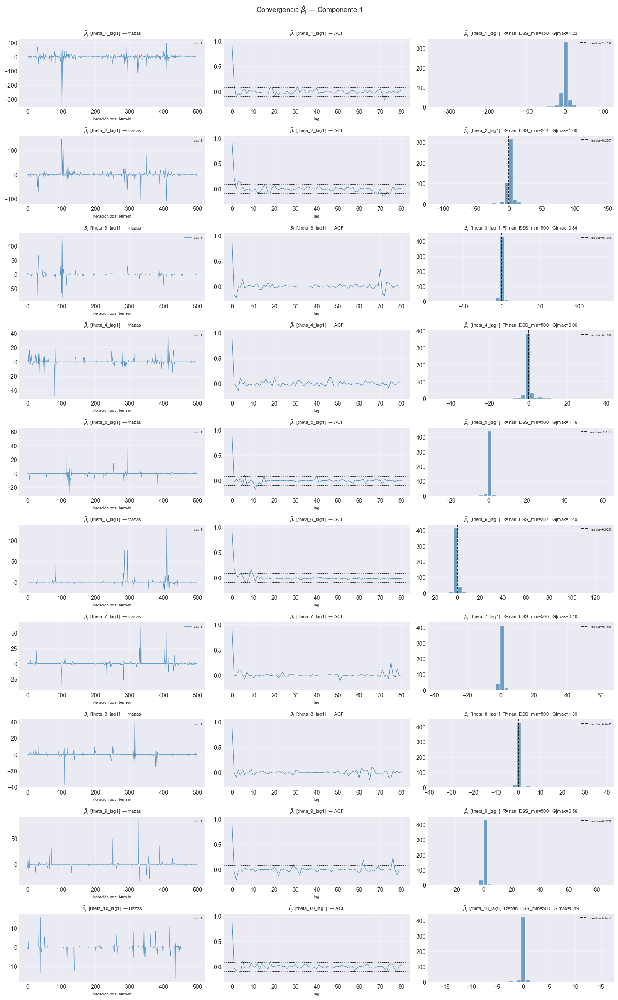

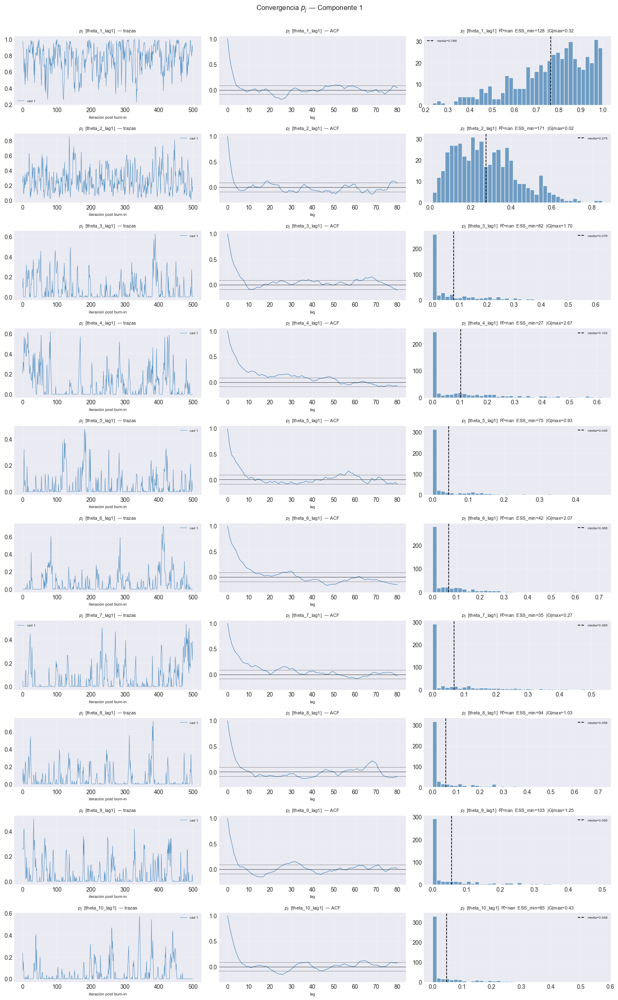

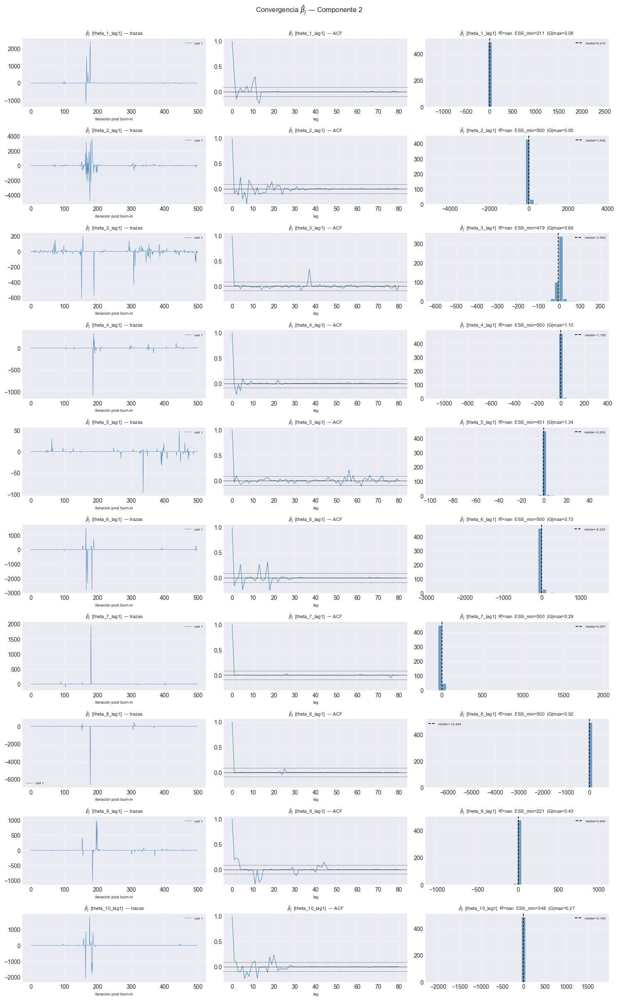

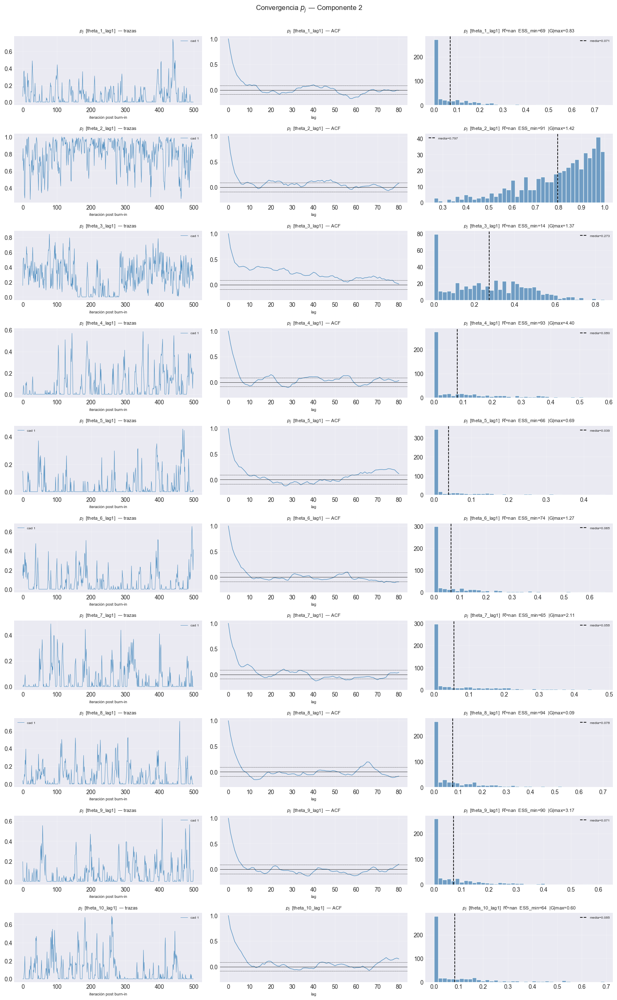

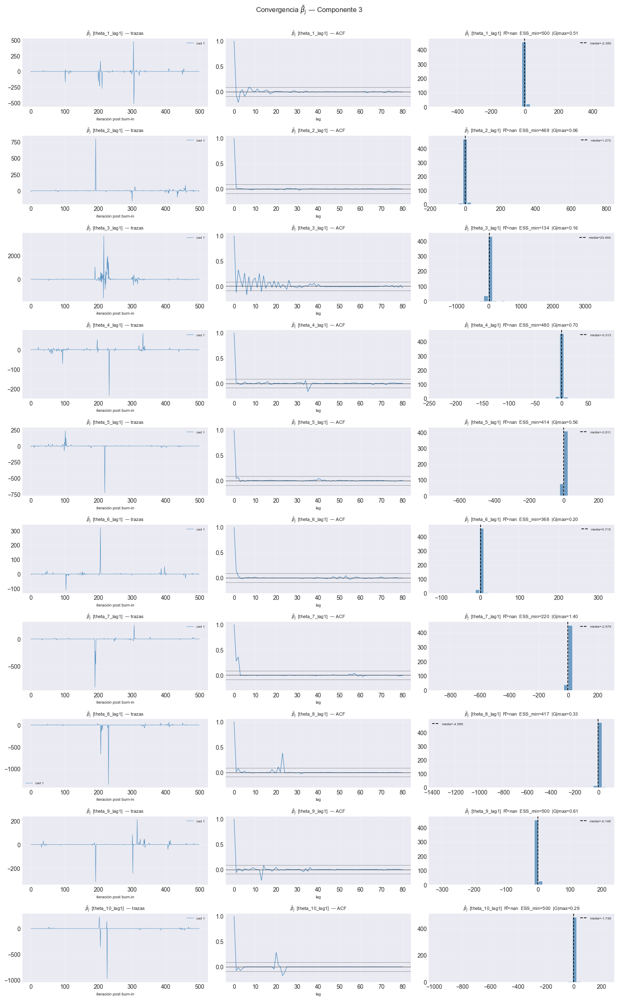

...

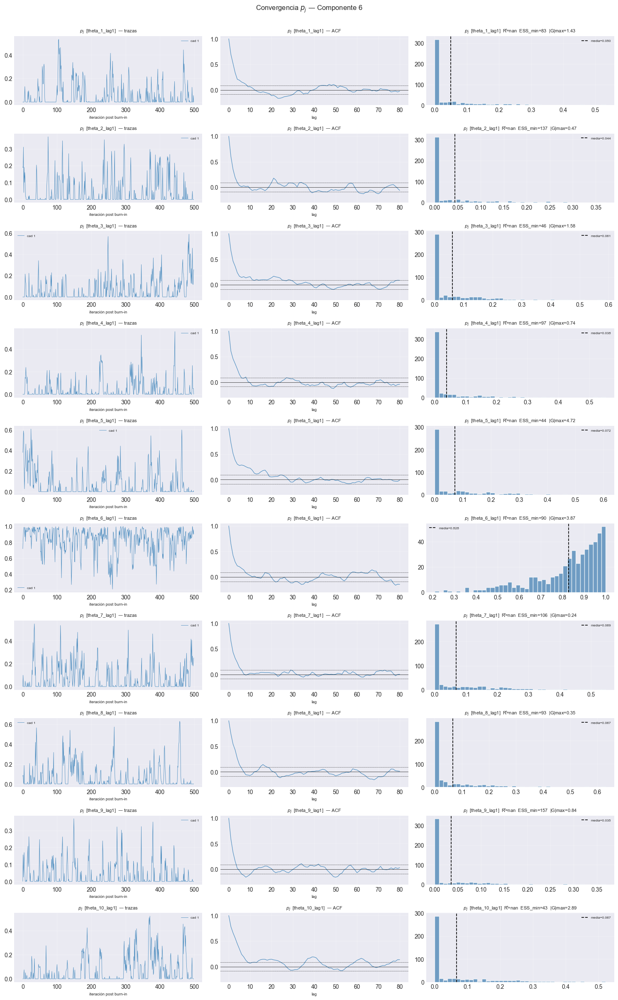

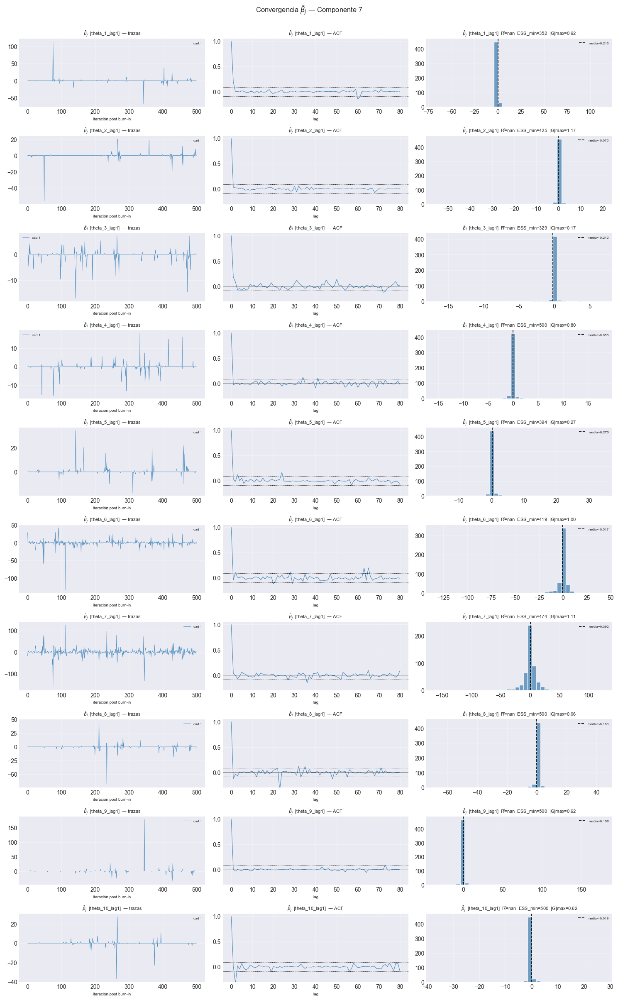

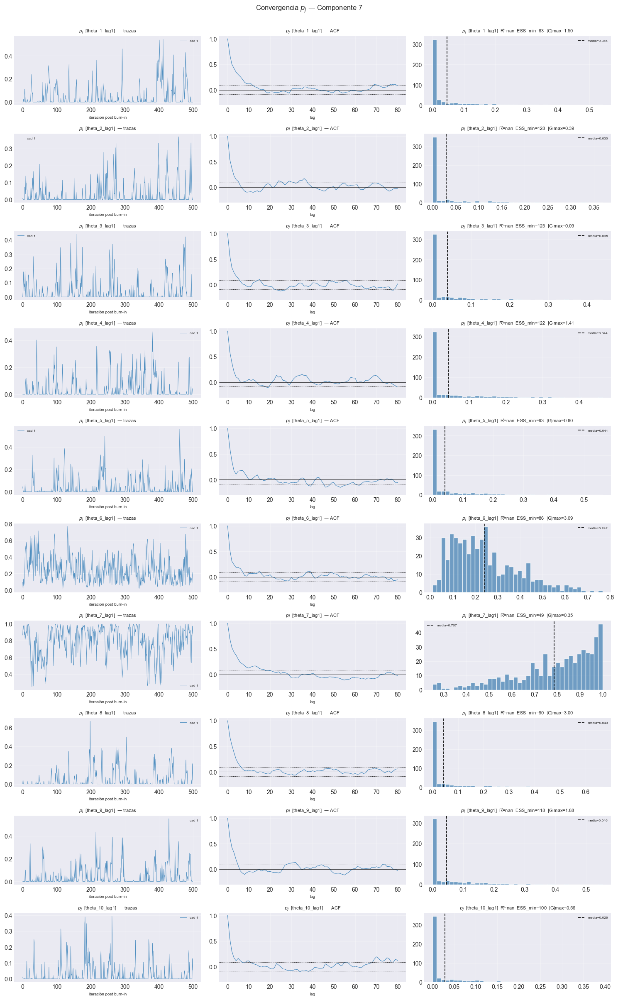

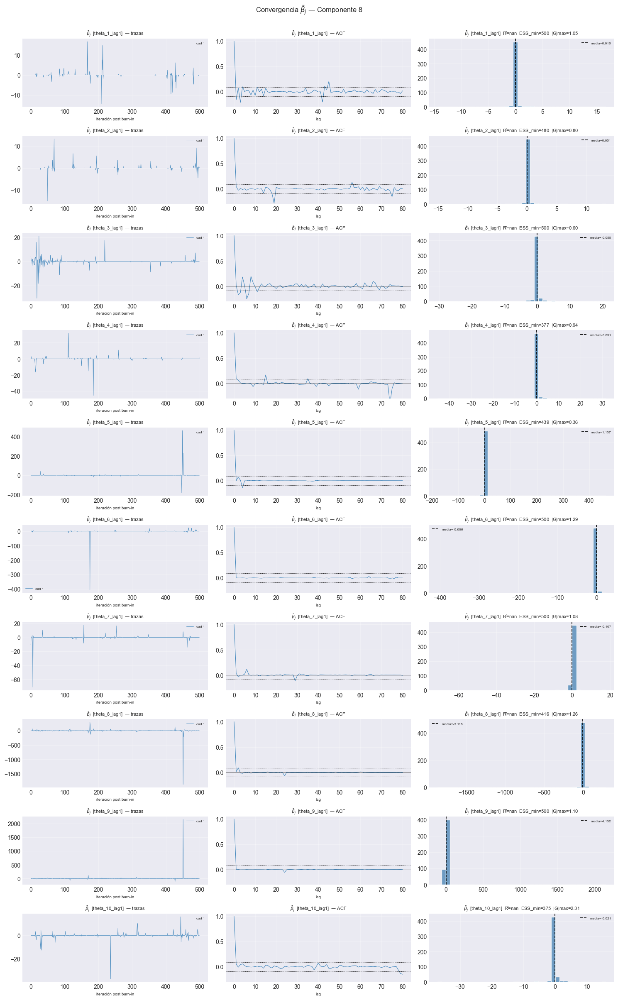

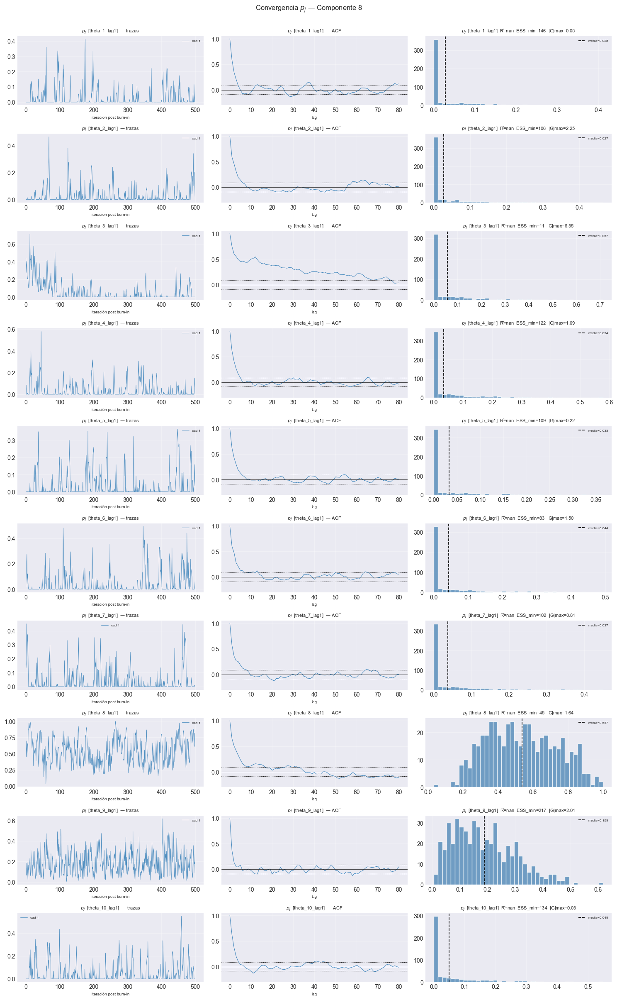

C:\Users\JuanFran\AppData\Local\Temp\ipykernel_8076\3435549116.py:13: RuntimeWarning: invalid value encountered in divide
  acf_full /= acf_full[0]


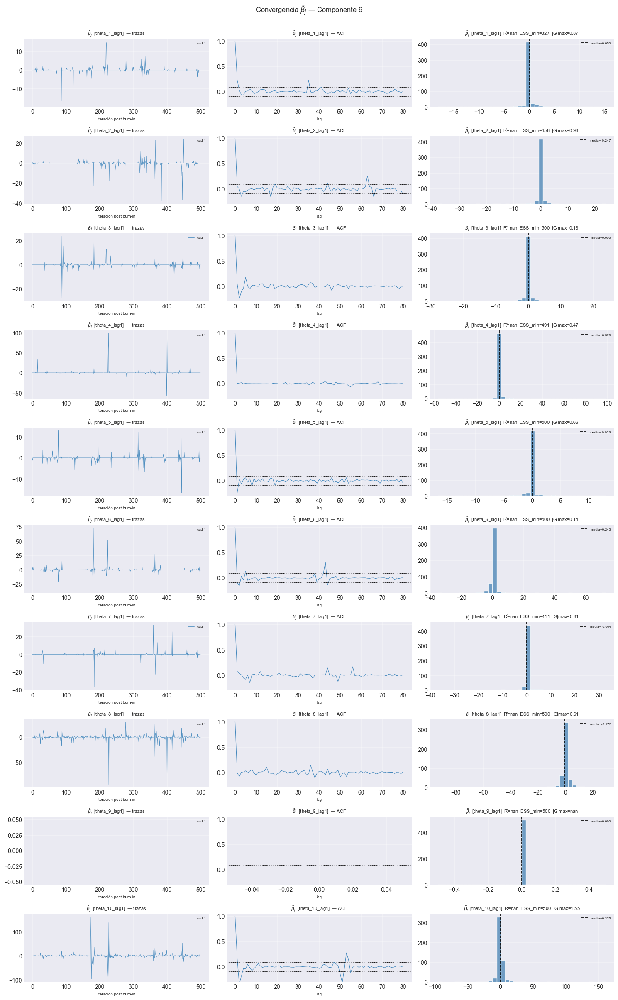

C:\Users\JuanFran\AppData\Local\Temp\ipykernel_8076\3435549116.py:13: RuntimeWarning: invalid value encountered in divide
  acf_full /= acf_full[0]


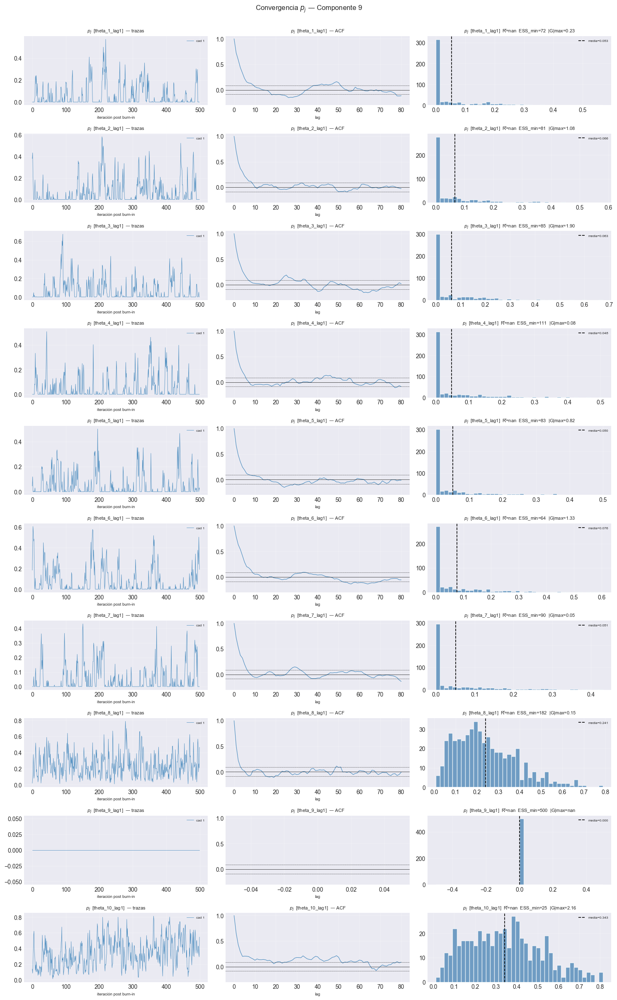

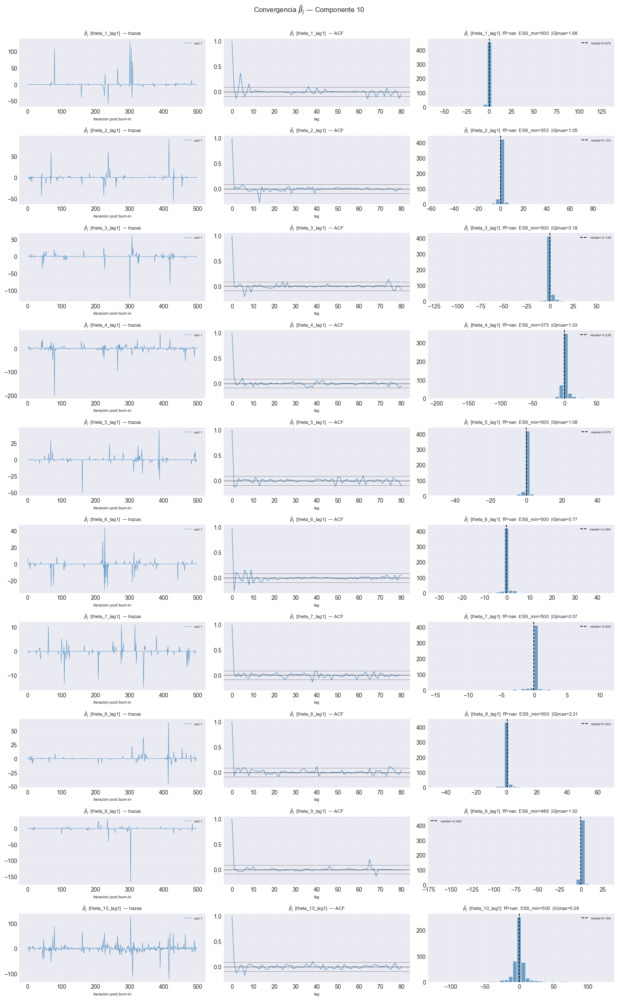

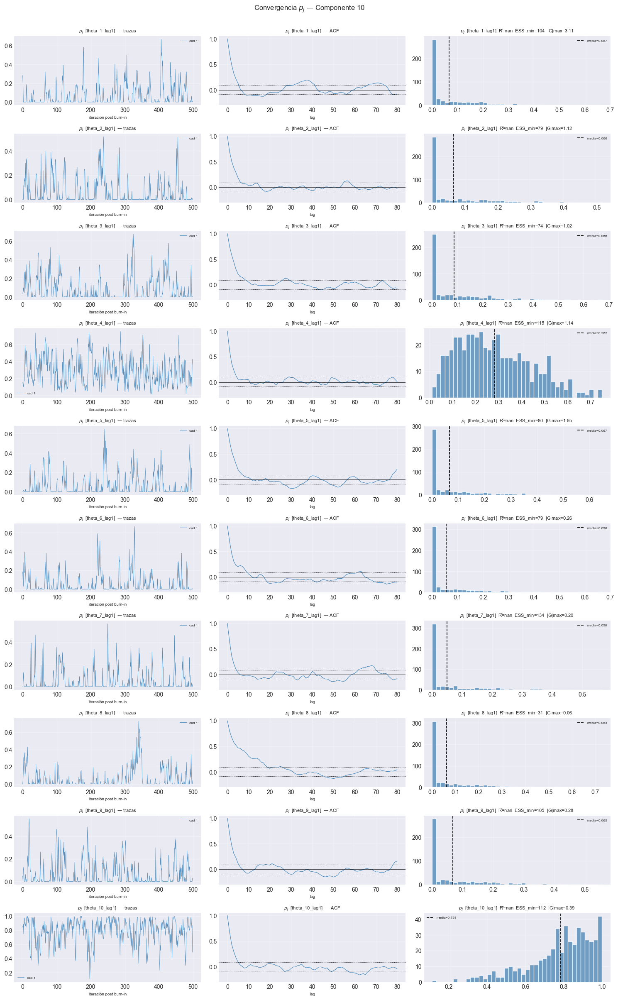

In [69]:
# ══════════════════════════════════════════════════════════════════════════════
# CELDA A — Helper por variable + construcción de etiquetas
# ══════════════════════════════════════════════════════════════════════════════

def extract_var_trace(trace: np.ndarray, j: int, burn: int) -> np.ndarray:
    """
    Extrae la traza post-burn-in de la variable j como vector 1D.

    - betajhout (nsim, N, p) → promedia sobre átomos N → (nsim-burn,)
    - pijout    (nsim, p)    → selecciona columna j   → (nsim-burn,)
    """
    if trace.ndim == 3:
        return trace[burn:, :, j].mean(axis=1).astype(np.float64)
    elif trace.ndim == 2:
        return trace[burn:, j].astype(np.float64)
    else:
        raise ValueError(f"ndim={trace.ndim} no soportado para extracción por variable")


# Parámetros a diagnosticar POR VARIABLE (clave trace → prefijo de etiqueta)
VAR_PARAMS = {
    "betajhout": r"$\bar{\beta}_j$",   # (nsim, N, p) — promedio sobre átomos
    "pijout":    r"$p_j$",             # (nsim, p)    — probabilidad de inclusión
}

# Nombre de las covariables por componente (leído desde el modelo ya entrenado)
# feature_names_[j] = nombre de la j-ésima covariable (sin intercepto)
var_labels_per_comp = {
    k: models_chains[k][0].feature_names_
    for k in range(n_components)
}

p_per_comp = {k: models_chains[k][0].n_features_ for k in range(n_components)}

print("Variables por componente:")
for k in range(n_components):
    print(f"  comp {k+1}: p={p_per_comp[k]}  →  {var_labels_per_comp[k]}")
print(f"\nParámetros a diagnosticar por variable: {list(VAR_PARAMS.keys())}")


# ══════════════════════════════════════════════════════════════════════════════
# CELDA B — Tabla de diagnósticos ESS / Geweke / R̂ por variable
# ══════════════════════════════════════════════════════════════════════════════

burn = 1000

var_diag_records = []

for k in range(n_components):
    feat_names = var_labels_per_comp[k]
    p = p_per_comp[k]

    for param, lbl_prefix in VAR_PARAMS.items():
        for j, fname in enumerate(feat_names):
            per_chain = []
            for c in range(N_CHAINS):
                trace_c = models_chains[k][c].traces[param]
                per_chain.append(extract_var_trace(trace_c, j, burn))

            chains_mat = np.vstack(per_chain)   # (N_CHAINS, n_post)

            ess_c    = [ess_geyer(chains_mat[c]) for c in range(N_CHAINS)]
            geweke_c = [geweke_z(chains_mat[c])  for c in range(N_CHAINS)]
            rhat     = gelman_rubin(chains_mat)

            var_diag_records.append({
                "componente": k + 1,
                "param":      param,
                "variable":   fname,
                "ESS_min":    float(np.min(ess_c)),
                "ESS_mean":   float(np.mean(ess_c)),
                "ESS_max":    float(np.max(ess_c)),
                "|Geweke|_max": float(np.max(np.abs(geweke_c))),
                "Rhat":       rhat,
                "converge":   (rhat < 1.1)
                              and (np.min(ess_c) > 100)
                              and (np.max(np.abs(geweke_c)) < 2.0),
            })

var_diag_df = pd.DataFrame(var_diag_records)

# Mostrar tabla con formato, agrupada por componente y parámetro
display(
    var_diag_df.style
    .format({
        "ESS_min":      "{:.1f}",
        "ESS_mean":     "{:.1f}",
        "ESS_max":      "{:.1f}",
        "|Geweke|_max": "{:+.2f}",
        "Rhat":         "{:.3f}",
    })
    .background_gradient(subset=["Rhat"], cmap="RdYlGn_r", vmin=1.0, vmax=1.2)
    .background_gradient(subset=["ESS_min"], cmap="RdYlGn",  vmin=0,   vmax=500)
    .map(lambda v: "font-weight: bold; color: #c0392b;" if v is False else "",
     subset=["converge"])
    .set_caption("Diagnósticos MCMC por variable — β̄_j y p_j")
)


# ══════════════════════════════════════════════════════════════════════════════
# CELDA C — Gráficos: traza | ACF | posterior por variable
# ══════════════════════════════════════════════════════════════════════════════

colors_chain = ["#1a6faf", "#e07b39", "#3aaa35", "#9b59b6", "#c0392b"]
max_lag      = 80

for k in range(n_components):
    feat_names = var_labels_per_comp[k]
    p          = p_per_comp[k]

    for param, lbl_prefix in VAR_PARAMS.items():

        fig, axes = plt.subplots(p, 3, figsize=(15, 2.4 * p), squeeze=False)
        fig.suptitle(
            f"Convergencia {lbl_prefix} — Componente {k+1}",
            fontsize=12, y=1.002,
        )

        for j, fname in enumerate(feat_names):
            ax_trace, ax_acf, ax_post = axes[j]

            # Trazas post-burn-in por cadena
            chains_post = [
                extract_var_trace(models_chains[k][c].traces[param], j, burn)
                for c in range(N_CHAINS)
            ]
            n_post = len(chains_post[0])

            # ── (a) Trazas superpuestas ──────────────────────────────────
            for c, ch in enumerate(chains_post):
                ax_trace.plot(ch, lw=0.6, alpha=0.75, color=colors_chain[c],
                              label=f"cad {c+1}")
            ax_trace.set_title(f"{lbl_prefix}  [{fname}]  — trazas", fontsize=8)
            ax_trace.set_xlabel("iteración post burn-in", fontsize=7)
            ax_trace.legend(fontsize=6, ncol=N_CHAINS)
            ax_trace.grid(True, alpha=0.3)

            # ── (b) ACF por cadena ───────────────────────────────────────
            for c, ch in enumerate(chains_post):
                rho = autocorr(ch, max_lag=max_lag)
                ax_acf.plot(np.arange(max_lag + 1), rho, lw=0.8, alpha=0.8,
                            color=colors_chain[c])
            ax_acf.axhline(0,  color="k", lw=0.5)
            ax_acf.axhline( 1.96 / np.sqrt(n_post), color="k", ls=":", lw=0.7)
            ax_acf.axhline(-1.96 / np.sqrt(n_post), color="k", ls=":", lw=0.7)
            ax_acf.set_title(f"{lbl_prefix}  [{fname}]  — ACF", fontsize=8)
            ax_acf.set_xlabel("lag", fontsize=7)
            ax_acf.set_ylim(-0.3, 1.05)
            ax_acf.grid(True, alpha=0.3)

            # ── (c) Posterior combinada + métricas ───────────────────────
            combined = np.concatenate(chains_post)
            ax_post.hist(combined, bins=40, color="steelblue", alpha=0.75,
                         edgecolor="white")
            ax_post.axvline(combined.mean(), color="k", lw=1.2, ls="--",
                            label=f"media={combined.mean():.3f}")

            rec = var_diag_df[
                (var_diag_df["componente"] == k + 1) &
                (var_diag_df["param"]      == param) &
                (var_diag_df["variable"]   == fname)
            ].iloc[0]

            ax_post.set_title(
                f"{lbl_prefix}  [{fname}]  "
                f"R̂={rec['Rhat']:.3f}  "
                f"ESS_min={rec['ESS_min']:.0f}  "
                f"|G|max={rec['|Geweke|_max']:.2f}",
                fontsize=8,
            )
            ax_post.legend(fontsize=6)
            ax_post.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

# 7. Evaluación predictiva

Una vez verificada la convergencia, evaluamos el ajuste usando la primera cadena
(`c = 0`) — el resto se mantiene para diagnóstico, no para predicción. Esto es
estándar: con R̂ < 1.1 las cadenas convergieron a la misma distribución, así que
cualquiera de ellas sirve para inferencia.

In [66]:
eval_results = {}
inclusion_matrix = np.zeros((n_components, n_components * N_LAGS))
feature_names    = None

for k in range(n_components):
    m       = models_chains[k][0]
    in_rmse = m.rmse(dfs[k])
    in_pred = m.predict(dfs[k])
    y_obs   = dfs[k].iloc[:, 0].to_numpy()
    incl    = m.inclusion_probs(as_series=True)

    eval_results[k] = {
        "rmse":       in_rmse,
        "y_hat":      in_pred,
        "y_obs":      y_obs,
        "incl_vec":   incl.values,
        "incl_named": incl,
    }
    inclusion_matrix[k, :] = incl.values
    feature_names = list(incl.index)

    print(f"\nComponente {k+1}:  inRMSE = {in_rmse:.6f}")
    for name, val in incl.items():
        flag = " *" if val > 0.5 else "  "
        print(f"    P(γ=1 | {name:<20}) = {val:.4f}{flag}")


Componente 1:  inRMSE = 0.250547
    P(γ=1 | theta_1_lag1        ) = 1.0000 *
    P(γ=1 | theta_2_lag1        ) = 1.0000 *
    P(γ=1 | theta_3_lag1        ) = 0.0180  
    P(γ=1 | theta_4_lag1        ) = 0.0220  
    P(γ=1 | theta_5_lag1        ) = 0.0080  
    P(γ=1 | theta_6_lag1        ) = 0.0210  
    P(γ=1 | theta_7_lag1        ) = 0.0060  
    P(γ=1 | theta_8_lag1        ) = 0.0100  
    P(γ=1 | theta_9_lag1        ) = 0.0170  
    P(γ=1 | theta_10_lag1       ) = 0.0170  

Componente 2:  inRMSE = 0.261858
    P(γ=1 | theta_1_lag1        ) = 0.0070  
    P(γ=1 | theta_2_lag1        ) = 1.0000 *
    P(γ=1 | theta_3_lag1        ) = 0.7730 *
    P(γ=1 | theta_4_lag1        ) = 0.0150  
    P(γ=1 | theta_5_lag1        ) = 0.0040  
    P(γ=1 | theta_6_lag1        ) = 0.0100  
    P(γ=1 | theta_7_lag1        ) = 0.0210  
    P(γ=1 | theta_8_lag1        ) = 0.0110  
    P(γ=1 | theta_9_lag1        ) = 0.0080  
    P(γ=1 | theta_10_lag1       ) = 0.0140  

Componente 3:  inRMSE = 0.40875

## 8.1 Scater plot

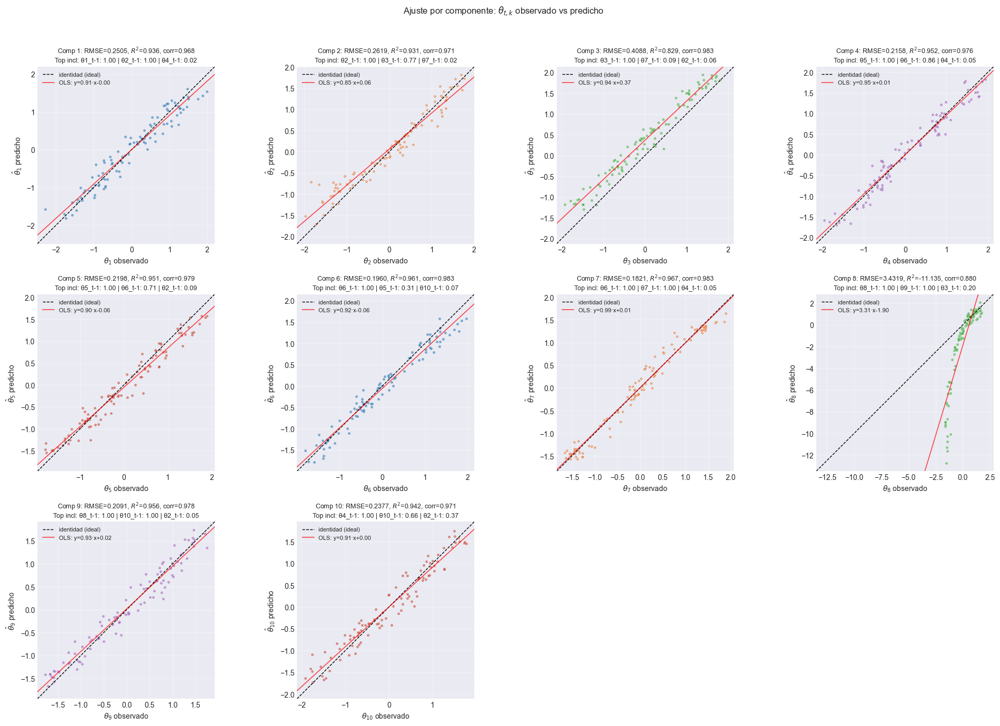

In [67]:
from scipy import stats as _stats

n_cols = min(n_components, 4)
n_rows = (n_components + n_cols - 1) // n_cols
component_colors = ["#1a6faf", "#e07b39", "#3aaa35", "#9b59b6", "#c0392b"]

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4.5 * n_rows))
axes = np.atleast_1d(axes).flatten()

for k, ax in enumerate(axes[:n_components]):
    y_obs = eval_results[k]["y_obs"]
    y_hat = eval_results[k]["y_hat"]

    ss_res = np.sum((y_obs - y_hat) ** 2)
    ss_tot = np.sum((y_obs - y_obs.mean()) ** 2)
    rmse   = np.sqrt(ss_res / len(y_obs))                          # ← local, consistente con R²
    r2     = 1.0 - ss_res / ss_tot if ss_tot > 0 else np.nan
    corr   = np.corrcoef(y_obs, y_hat)[0, 1]
    slope, intercept, *_ = _stats.linregress(y_obs, y_hat)

    ax.scatter(y_obs, y_hat, s=14, alpha=0.55,
               color=component_colors[k % len(component_colors)],
               edgecolors="white", linewidths=0.3)

    lims = [min(y_obs.min(), y_hat.min()), max(y_obs.max(), y_hat.max())]
    pad  = 0.05 * (lims[1] - lims[0])
    lims = [lims[0] - pad, lims[1] + pad]
    ax.plot(lims, lims, "k--", lw=1.0, label="identidad (ideal)")

    xs = np.array(lims)
    ax.plot(xs, intercept + slope * xs, "r-", lw=1.2, alpha=0.7,
            label=f"OLS: y={slope:.2f}·x{intercept:+.2f}")

    ax.set_xlim(lims)
    ax.set_ylim(lims)
    ax.set_box_aspect(1)                                            # ← reemplaza set_aspect("equal")

    incl = eval_results[k]["incl_named"]
    top3 = incl.sort_values(ascending=False).head(3)
    incl_str = " | ".join(
        f"{name.replace('theta_', 'θ').replace('_lag', '_t-')}: {val:.2f}"
        for name, val in top3.items()
    )

    ax.set_xlabel(rf"$\theta_{{{k+1}}}$ observado")
    ax.set_ylabel(rf"$\hat{{\theta}}_{{{k+1}}}$ predicho")
    ax.set_title(
        rf"Comp {k+1}: RMSE={rmse:.4f}, $R^2$={r2:.3f}, corr={corr:.3f}"
        f"\nTop incl: {incl_str}",
        fontsize=9,
    )
    ax.legend(fontsize=8, loc="upper left")
    ax.grid(True, alpha=0.4)

# Oculta ejes sobrantes si n_components no llena la grilla
for ax in axes[n_components:]:
    ax.set_visible(False)

plt.suptitle(
    r"Ajuste por componente: $\theta_{t,k}$ observado vs predicho",
    fontsize=12, y=1.02,
)
plt.tight_layout()
plt.show()

## 7.2 Reconstrucción funcional

Verificación reconstrucción: max|X_true - X_repr_obs| = 5.06e-01
  ⚠️  Error alto — fr.reconstruct no recupera exactamente X[N_LAGS:]

── ESCALA ESTANDARIZADA ──
  RMSE representación : 0.112073   NRMSE=0.113
  RMSE modelo         : 0.948604   NRMSE=0.958
  RMSE total          : 0.955125   NRMSE=0.964
  Ratio modelo/total  : 0.993


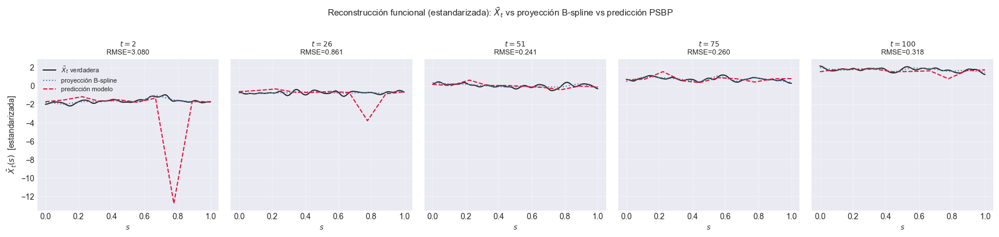

In [68]:
# ── Construcción de matrices de scores ──────────────────────────────────────
THETA_obs_mat  = np.column_stack([eval_results[k]["y_obs"] for k in range(n_components)])
THETA_pred_mat = np.column_stack([eval_results[k]["y_hat"] for k in range(n_components)])

# ── Reconstrucciones funcionales (escala ESTANDARIZADA) ─────────────────────
X_repr_obs_std  = fr.reconstruct(THETA_obs_mat)   # (99, 100)
X_repr_pred_std = fr.reconstruct(THETA_pred_mat)  # (99, 100)
X_true_std      = X[N_LAGS:, :]                   # (99, 100)

# ── Verificación ─────────────────────────────────────────────────────────────
recovery_err = np.max(np.abs(X_true_std - X_repr_obs_std))
print(f"Verificación reconstrucción: max|X_true - X_repr_obs| = {recovery_err:.2e}")
if recovery_err > 1e-6:
    print("  ⚠️  Error alto — fr.reconstruct no recupera exactamente X[N_LAGS:]")

# ── Métricas de descomposición ───────────────────────────────────────────────
def rmse_decomposition(true, repr_obs, repr_pred):
    err_repr  = true     - repr_obs
    err_model = repr_obs - repr_pred
    err_total = true     - repr_pred
    rmse_r = np.sqrt(np.mean(err_repr  ** 2))
    rmse_m = np.sqrt(np.mean(err_model ** 2))
    rmse_t = np.sqrt(np.mean(err_total ** 2))
    sd     = true.std()
    print(f"  RMSE representación : {rmse_r:.6f}   NRMSE={rmse_r/sd:.3f}")
    print(f"  RMSE modelo         : {rmse_m:.6f}   NRMSE={rmse_m/sd:.3f}")
    print(f"  RMSE total          : {rmse_t:.6f}   NRMSE={rmse_t/sd:.3f}")
    print(f"  Ratio modelo/total  : {rmse_m/rmse_t:.3f}")
    return rmse_r, rmse_m, rmse_t

print("\n── ESCALA ESTANDARIZADA ──")
m_std = rmse_decomposition(X_true_std, X_repr_obs_std, X_repr_pred_std)

# ── Visualización ────────────────────────────────────────────────────────────
N_SNAPSHOTS = 5
T_eff       = X_true_std.shape[0]
t_indices   = np.linspace(0, T_eff - 1, N_SNAPSHOTS, dtype=int)

fig, axes = plt.subplots(1, N_SNAPSHOTS, figsize=(3.5 * N_SNAPSHOTS, 4.0),
                         sharey=True)

for col_idx, t_idx in enumerate(t_indices):
    ax     = axes[col_idx]
    t_real = t_idx + N_LAGS + 1

    ax.plot(domain.grid, X_true_std[t_idx],
            color="black",     lw=1.4, alpha=0.85,
            label=r"$\tilde X_t$ verdadera"  if col_idx == 0 else None)
    ax.plot(domain.grid, X_repr_obs_std[t_idx],
            color="steelblue", lw=1.4, ls=":",
            label=r"proyección B-spline"      if col_idx == 0 else None)
    ax.plot(domain.grid, X_repr_pred_std[t_idx],
            color="crimson",   lw=1.4, ls="--",
            label=r"predicción modelo"        if col_idx == 0 else None)

    rmse_snap = np.sqrt(np.mean((X_true_std[t_idx] - X_repr_pred_std[t_idx]) ** 2))
    ax.set_title(rf"$t = {t_real}$" + f"\nRMSE={rmse_snap:.3f}", fontsize=9)
    ax.set_xlabel("$s$", fontsize=9)
    ax.grid(True, alpha=0.35)

axes[0].set_ylabel(r"$\tilde X_t(s)$  [estandarizada]", fontsize=10)
axes[0].legend(fontsize=8, loc="best")

plt.suptitle(
    r"Reconstrucción funcional (estandarizada): "
    r"$\tilde X_t$ vs proyección B-spline vs predicción PSBP",
    fontsize=11, y=1.02,
)
plt.tight_layout()
plt.show()

# 9. Persistencia de resultados

In [ ]:
# Deberian guardarse cada grafico dentro del nootbook o aca al final 